## Time-Series Frequency Analysis

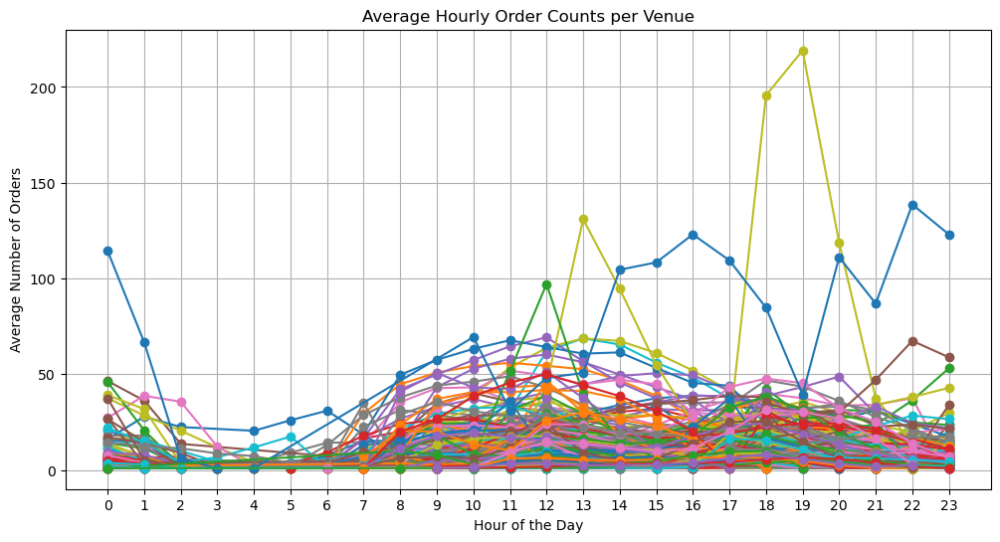

In [41]:
import polars as pl
import matplotlib.pyplot as plt

# Read data from CSV file
filtered_df = pl.read_csv("../data/cleansed_data.csv").select(
    ["order_seated_at_local", "order_uuid", "venue_xref_id", "business_date", "concept"]
)

# Remove rows with None concept
filtered_df = filtered_df.filter(pl.col("concept").is_not_null())

# Convert to datetime
filtered_df = filtered_df.with_columns(
    pl.col("order_seated_at_local").str.strptime(pl.Datetime, "%Y-%m-%d %H:%M:%S")
)

# Create order_count column
filtered_df = filtered_df.with_columns(
    pl.lit(1).alias("order_count")
)

# Extract hour
filtered_df = filtered_df.with_columns(
    pl.col("order_seated_at_local").dt.hour().alias("hour")
)

# Group by venue, business date, and hour, then sum the order counts
hourly_order_counts = (
    filtered_df
    .group_by(["venue_xref_id", "business_date", "hour"])
    .agg(
        pl.sum("order_count").alias("order_count")
    )
)

# Calculate the average order count per hour for each venue
average_hourly_order_counts = (
    hourly_order_counts
    .join(
        filtered_df.select(["venue_xref_id", "concept"]).unique(),
        on="venue_xref_id"
    )
    .group_by(["venue_xref_id", "concept", "hour"])
    .agg(
        pl.mean("order_count").alias("order_count")
    )
    .sort(["venue_xref_id", "hour"])  # Ensure data is sorted by hour
)

# Plot the average hourly order counts for each venue
plt.figure(figsize=(12, 6))

for venue in average_hourly_order_counts.select("venue_xref_id").unique()["venue_xref_id"]:
    venue_data = average_hourly_order_counts.filter(pl.col("venue_xref_id") == venue)
    
    # Convert to lists for plotting
    hours = venue_data["hour"].to_list()
    counts = venue_data["order_count"].to_list()
    
    plt.plot(hours, counts, marker='o', label=str(venue))

plt.title('Average Hourly Order Counts per Venue')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Number of Orders')
plt.grid(True)
plt.xticks(range(0, 24))
plt.show()

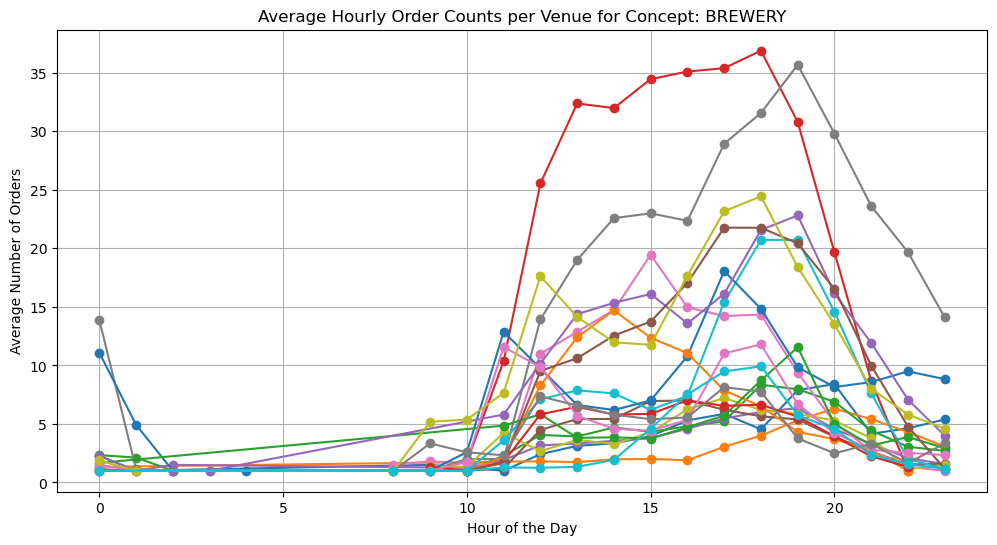

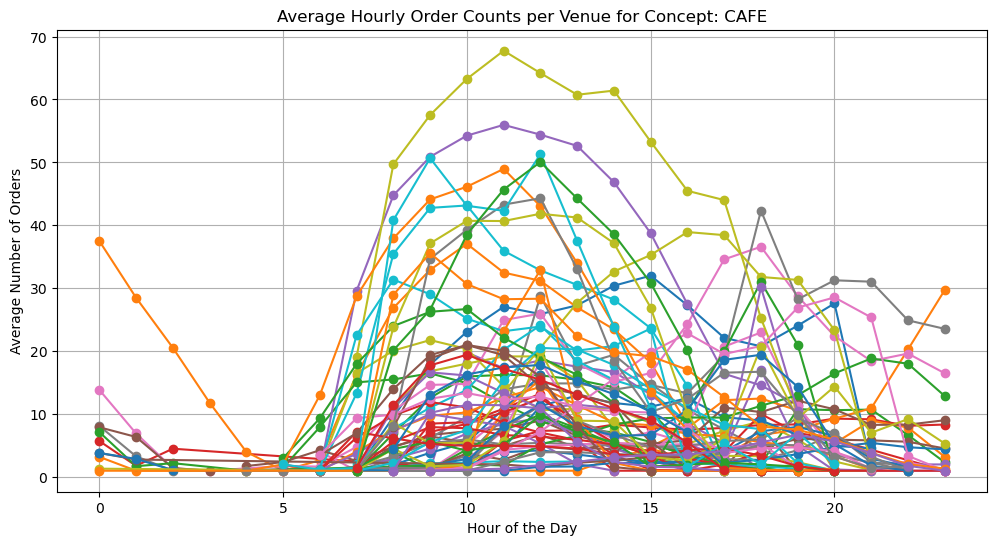

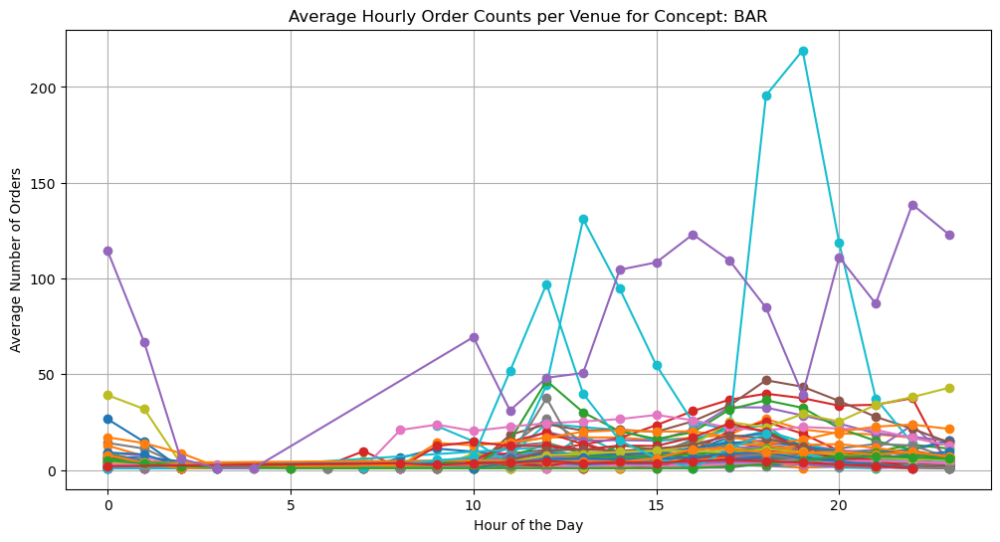

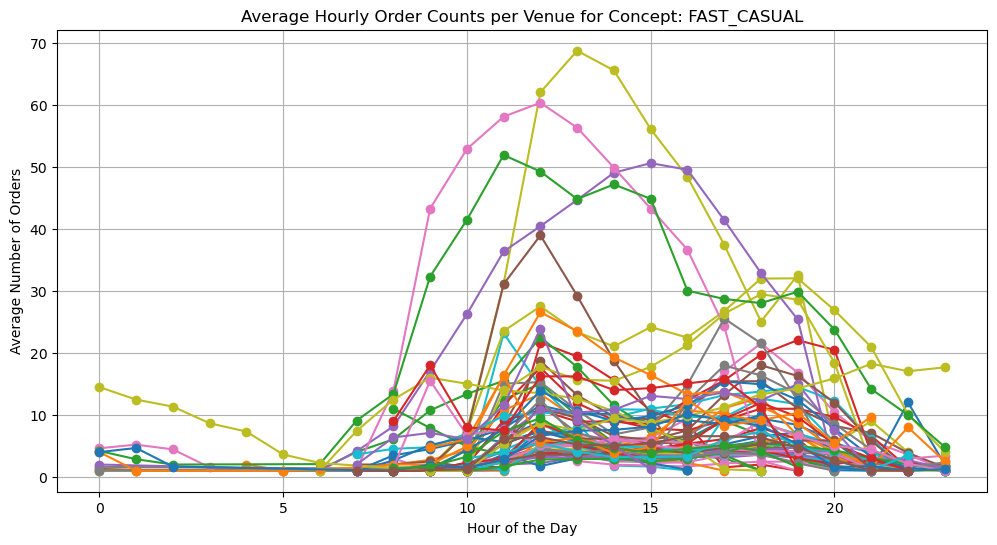

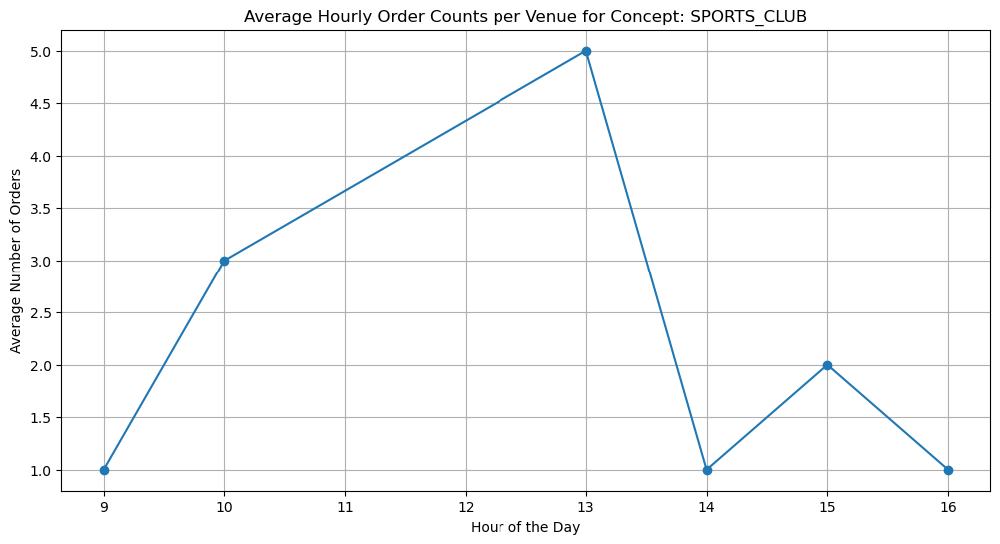

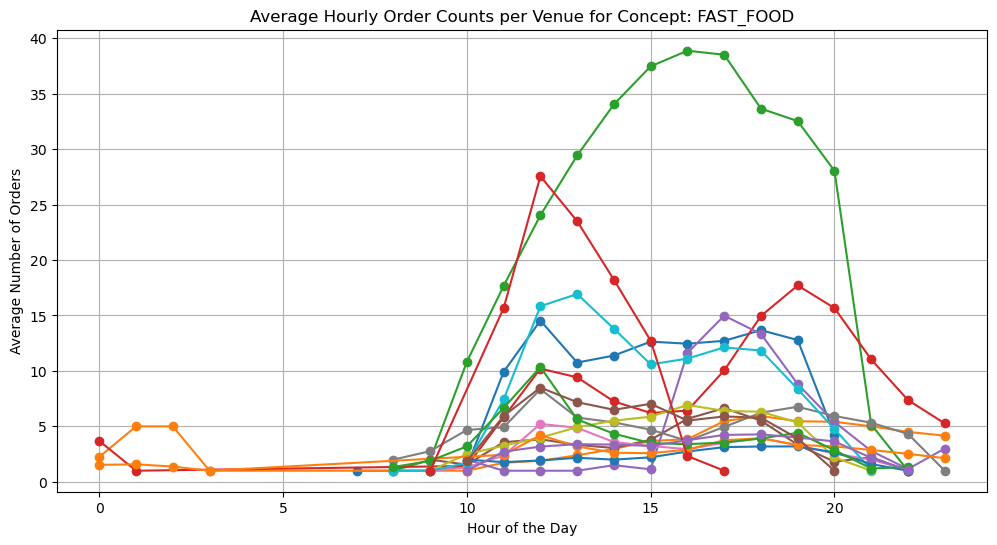

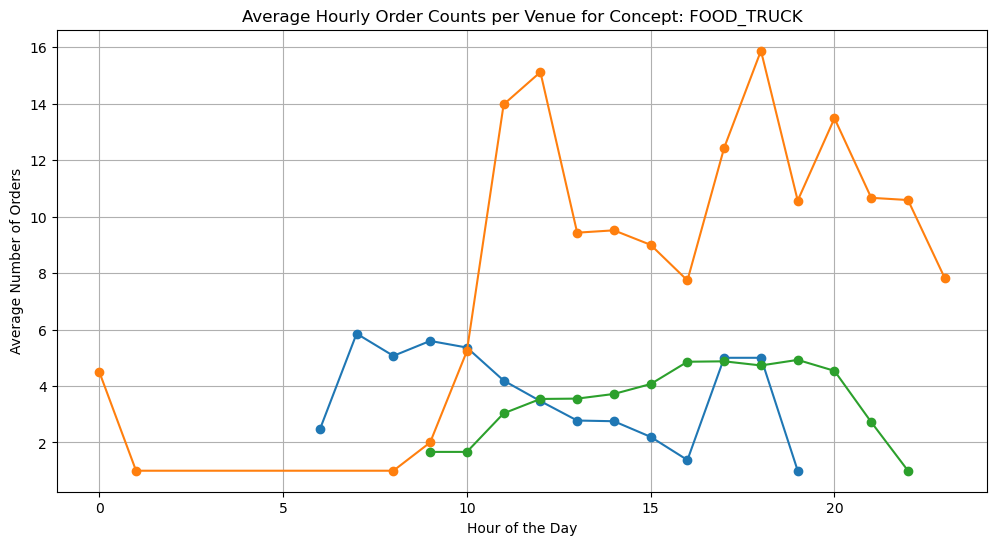

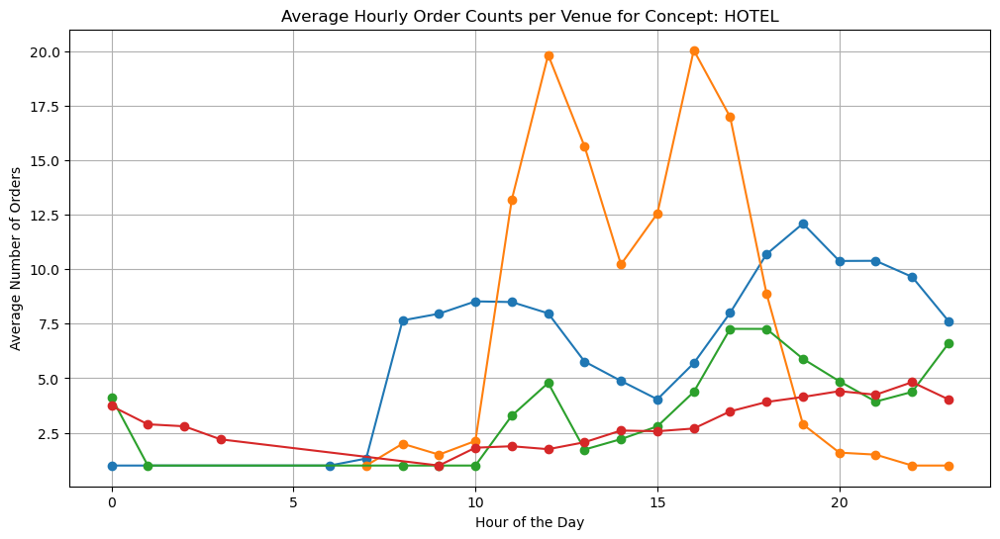

C:\Users\Natha\AppData\Local\Temp\ipykernel_11816\1321045122.py:6: UserWarning: Comparisons with None always result in null. Consider using `.is_null()` or `.is_not_null()`.
  concept_data = average_hourly_order_counts.filter(pl.col("concept") == concept)


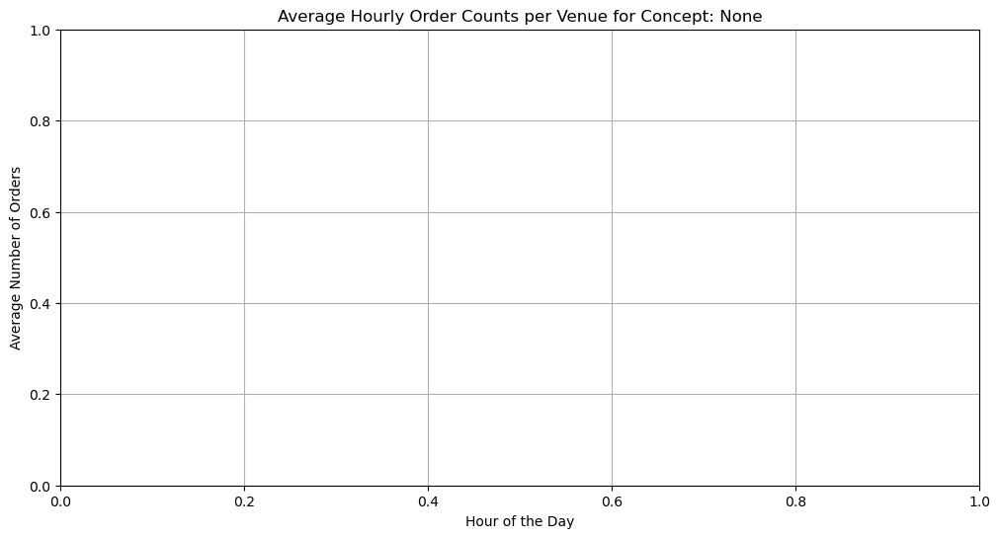

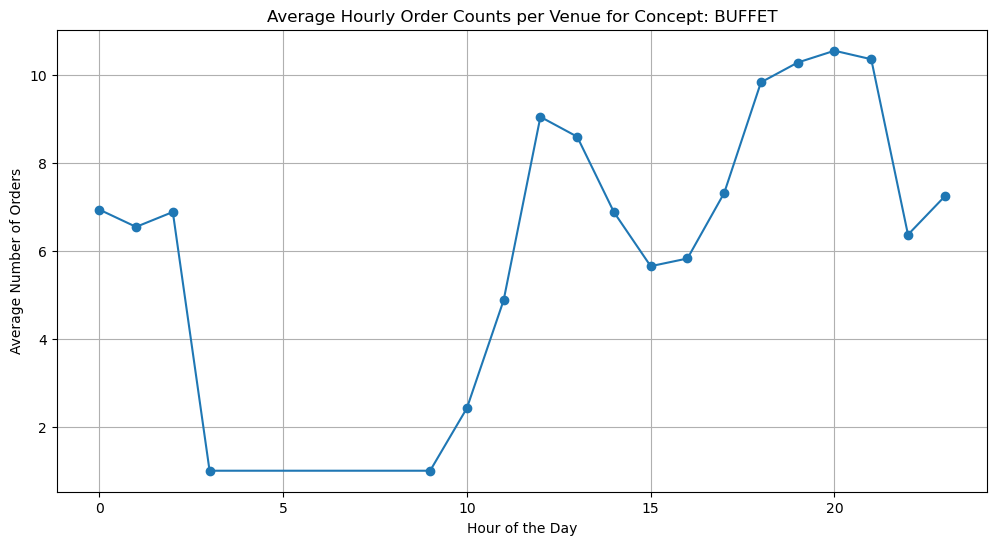

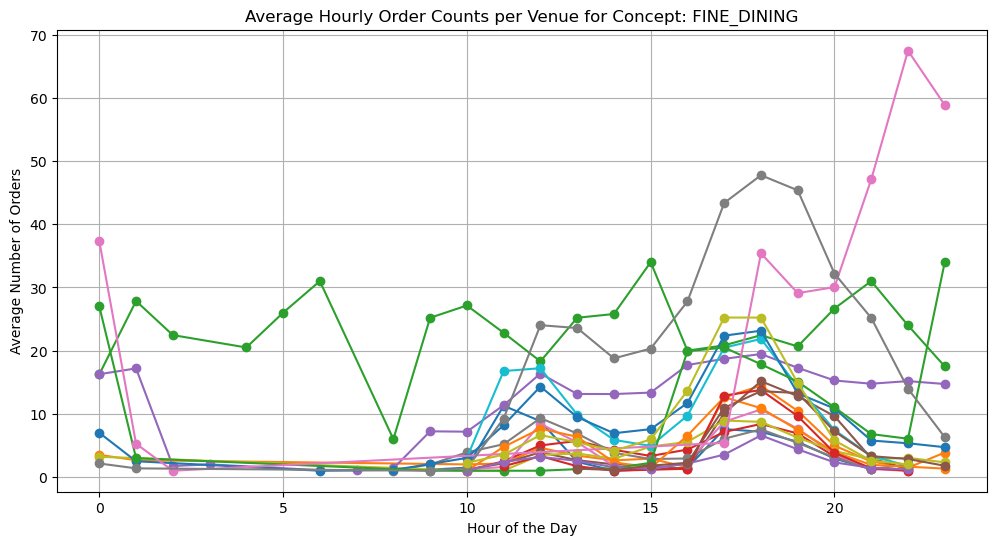

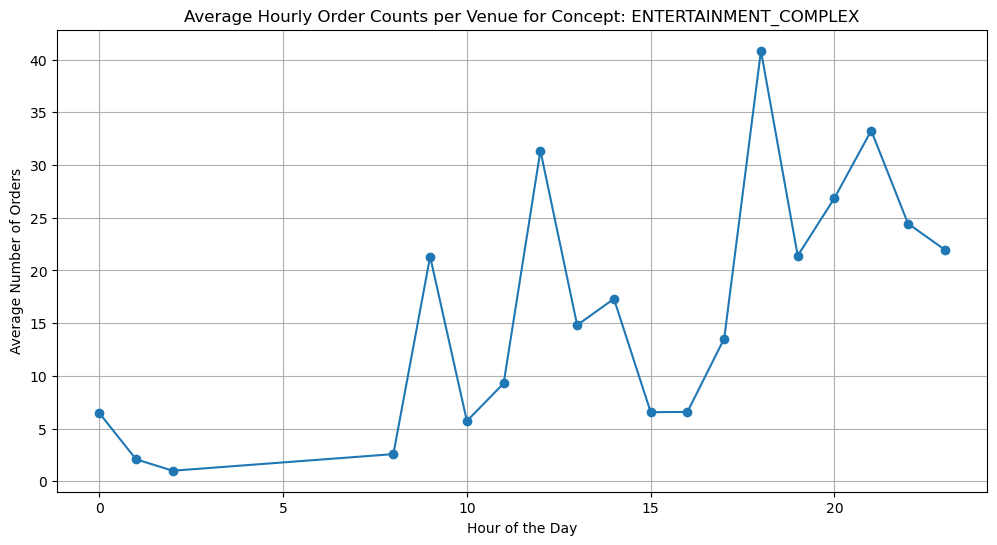

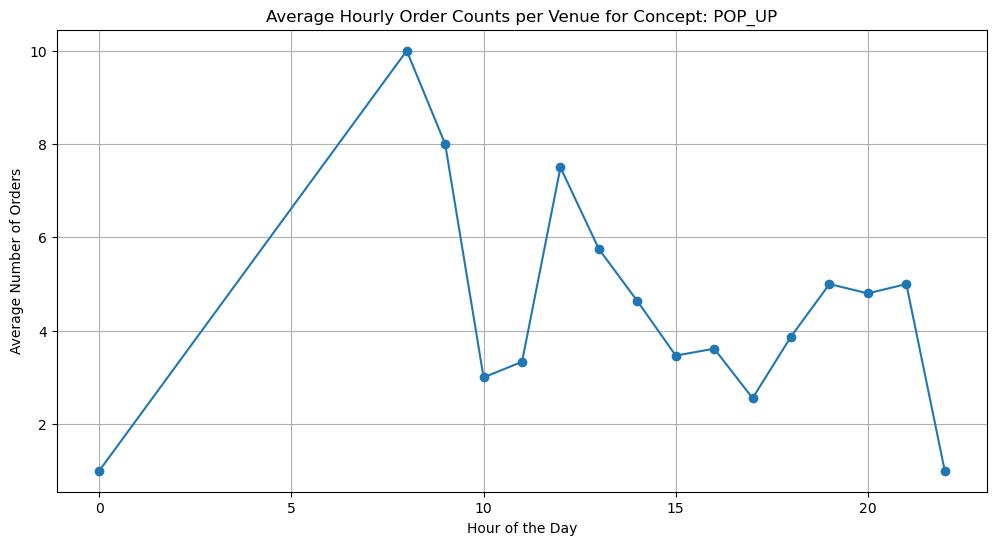

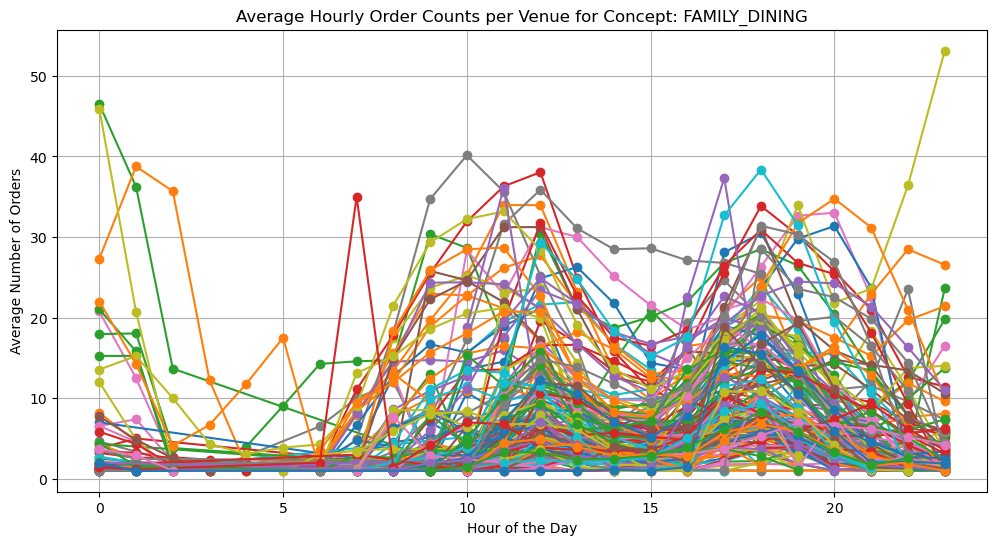

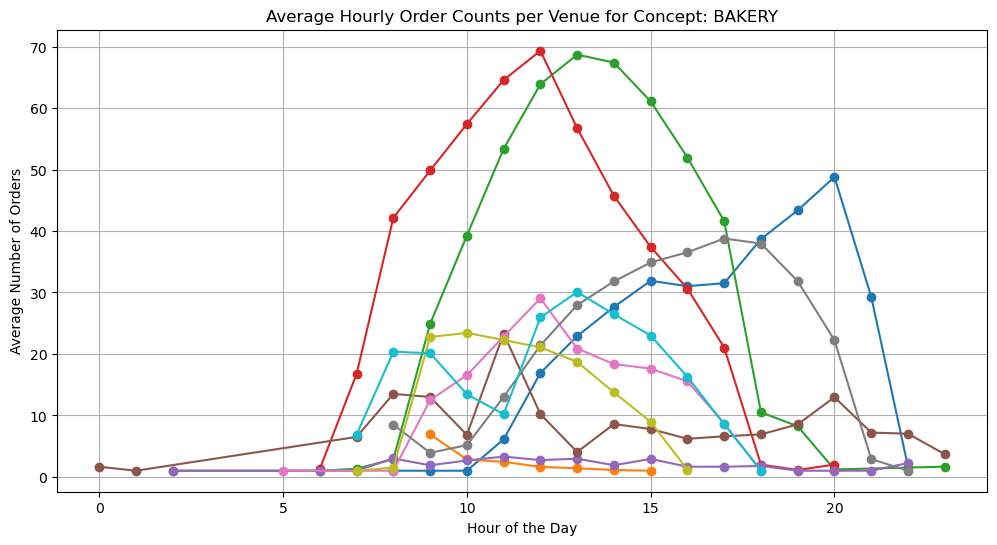

In [37]:
# Group by concept, venue, and hour, then calculate the average order count
concepts = average_hourly_order_counts.select("concept").unique()["concept"]

for concept in concepts:
    plt.figure(figsize=(12, 6))
    concept_data = average_hourly_order_counts.filter(pl.col("concept") == concept)
    
    for venue in concept_data.select("venue_xref_id").unique()["venue_xref_id"]:
        venue_data = concept_data.filter(pl.col("venue_xref_id") == venue)
        
        # Convert to lists for plotting
        hours = venue_data["hour"].to_list()
        counts = venue_data["order_count"].to_list()
        
        plt.plot(hours, counts, marker='o', label=str(venue))
    
    plt.title(f'Average Hourly Order Counts per Venue for Concept: {concept}')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Average Number of Orders')
    plt.grid(True)
    plt.show()


## Normalization

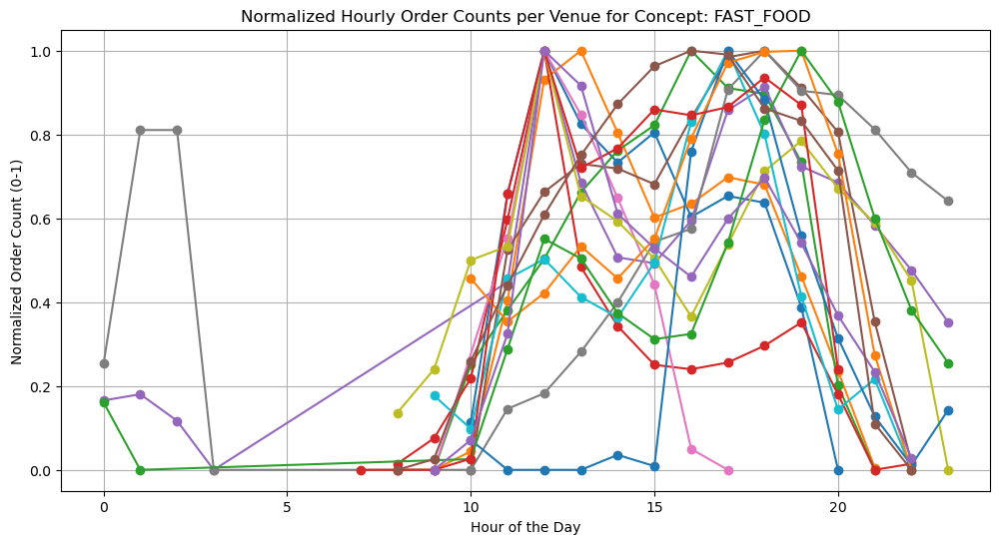

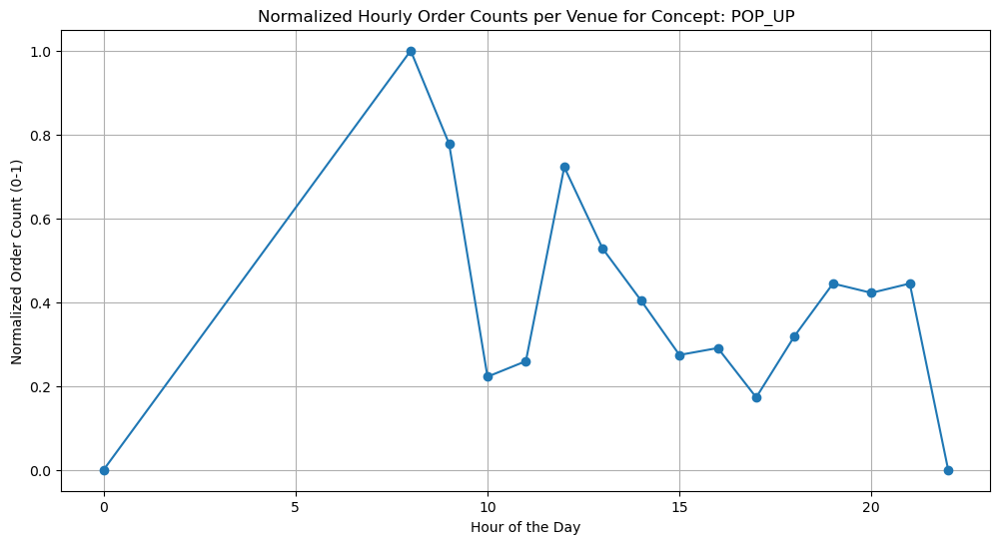

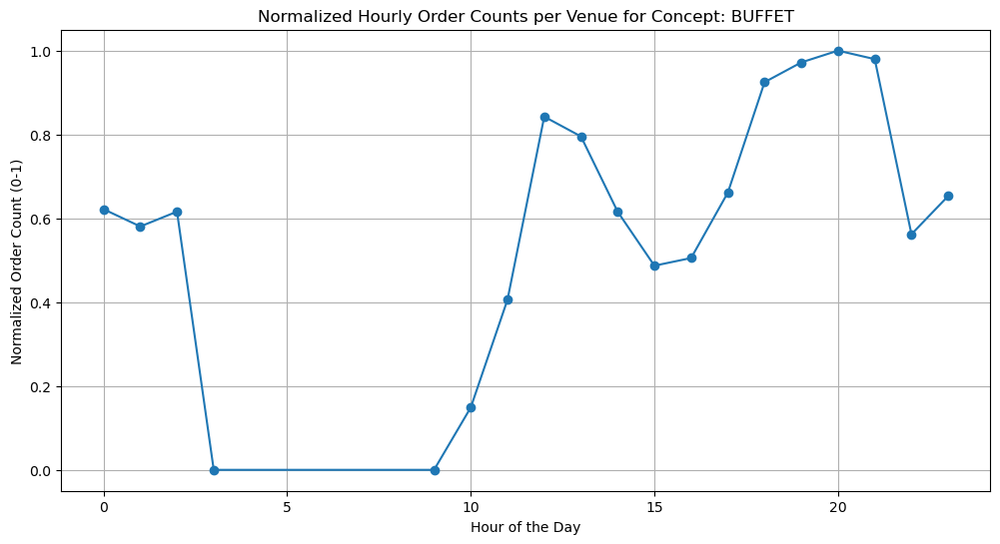

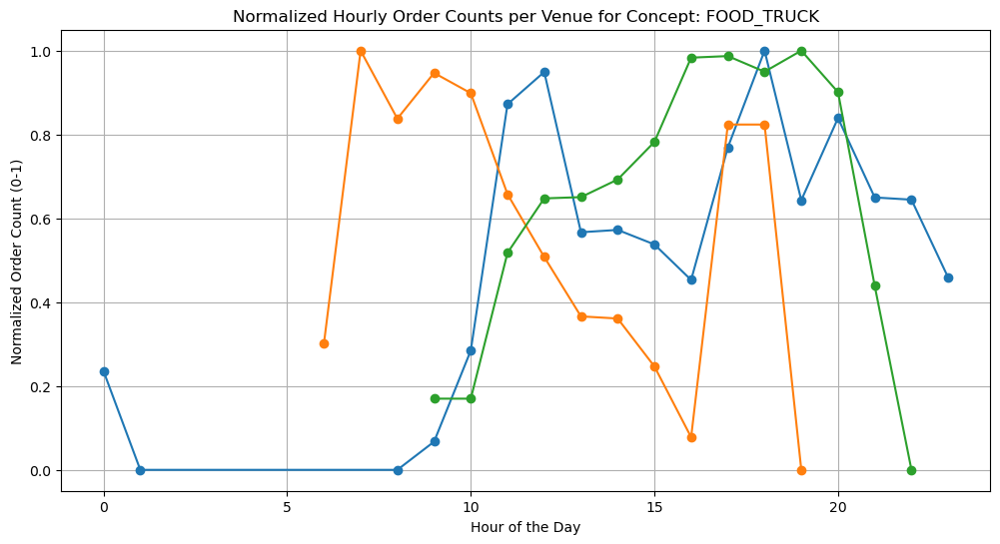

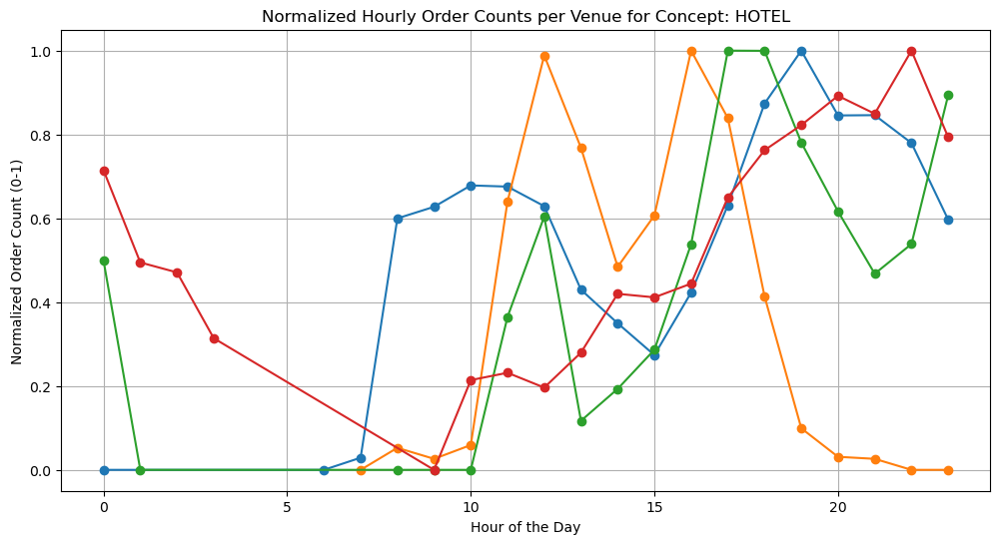

...

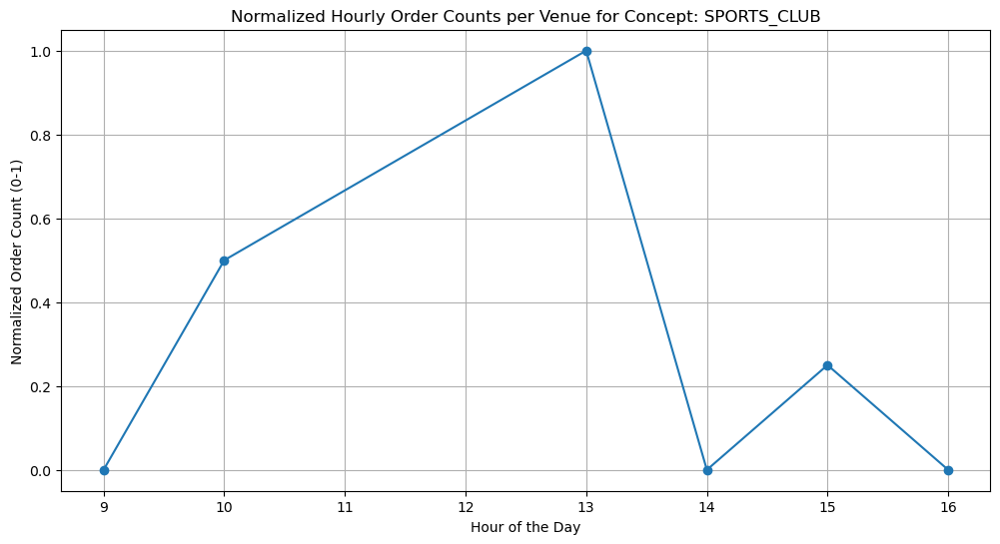

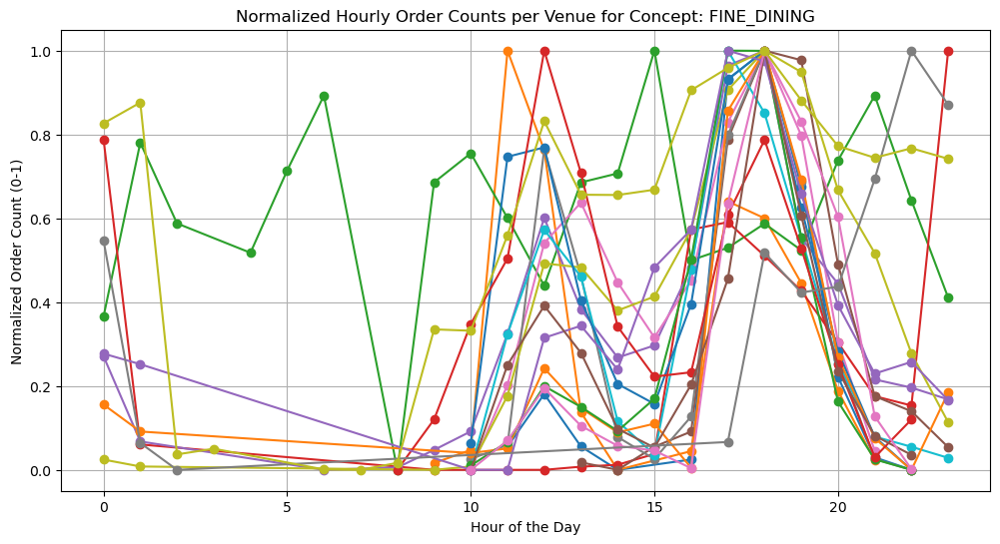

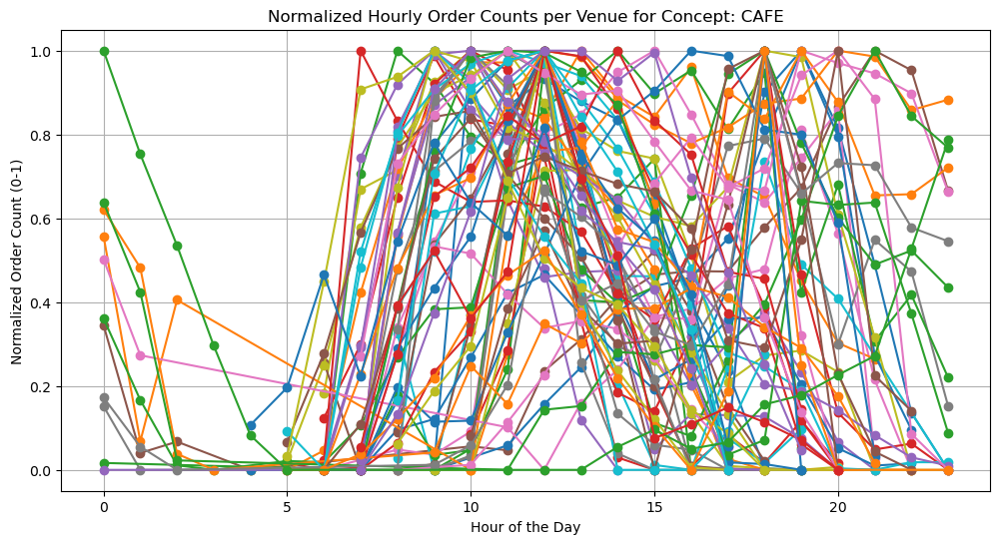

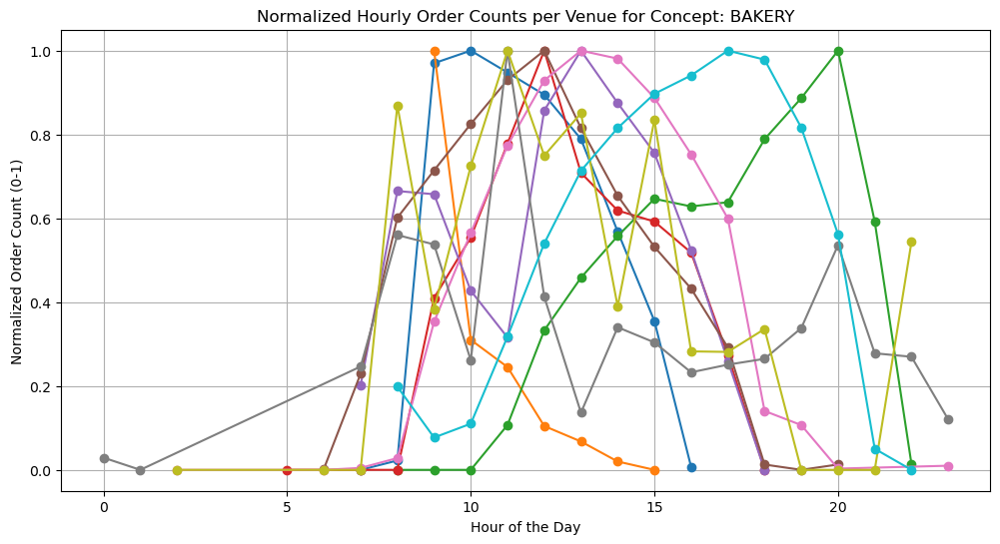

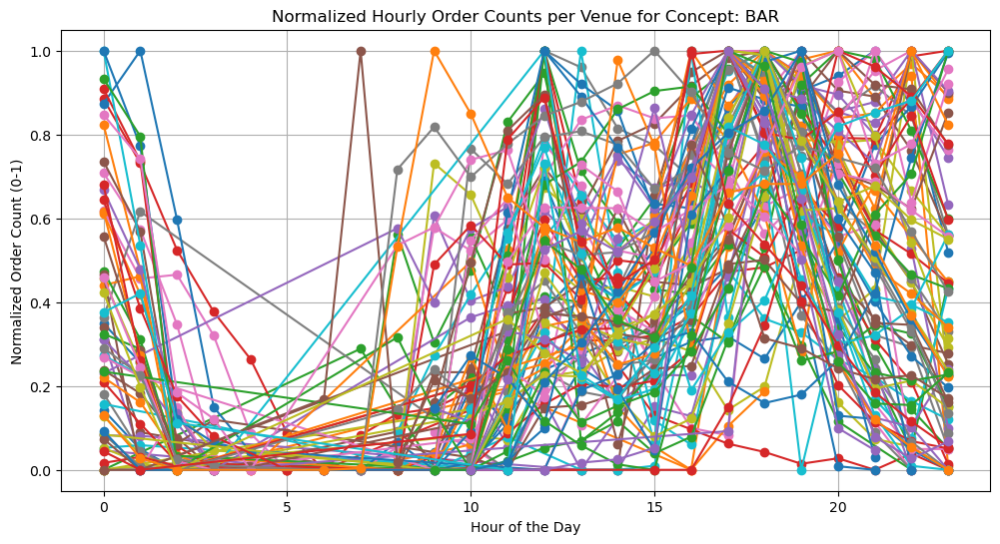

In [42]:
# Normalize order counts per venue (not per concept)
average_hourly_order_counts = average_hourly_order_counts.with_columns(
    (
        (pl.col('order_count') - pl.col('order_count').min().over(['concept', 'venue_xref_id'])) /
        (pl.col('order_count').max().over(['concept', 'venue_xref_id']) - pl.col('order_count').min().over(['concept', 'venue_xref_id']))
    ).alias('normalized_order_count')
)

# Plot the normalized hourly order counts
concepts = average_hourly_order_counts.get_column('concept').unique().to_list()
for concept in concepts:
    plt.figure(figsize=(12, 6))
    concept_data = average_hourly_order_counts.filter(pl.col('concept') == concept)
    
    for venue in concept_data.get_column('venue_xref_id').unique():
        venue_data = concept_data.filter(pl.col('venue_xref_id') == venue)
        plt.plot(venue_data.get_column('hour'), venue_data.get_column('normalized_order_count'), marker='o')

    plt.title(f'Normalized Hourly Order Counts per Venue for Concept: {concept}')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Normalized Order Count (0-1)')
    plt.grid(True)
    plt.show()


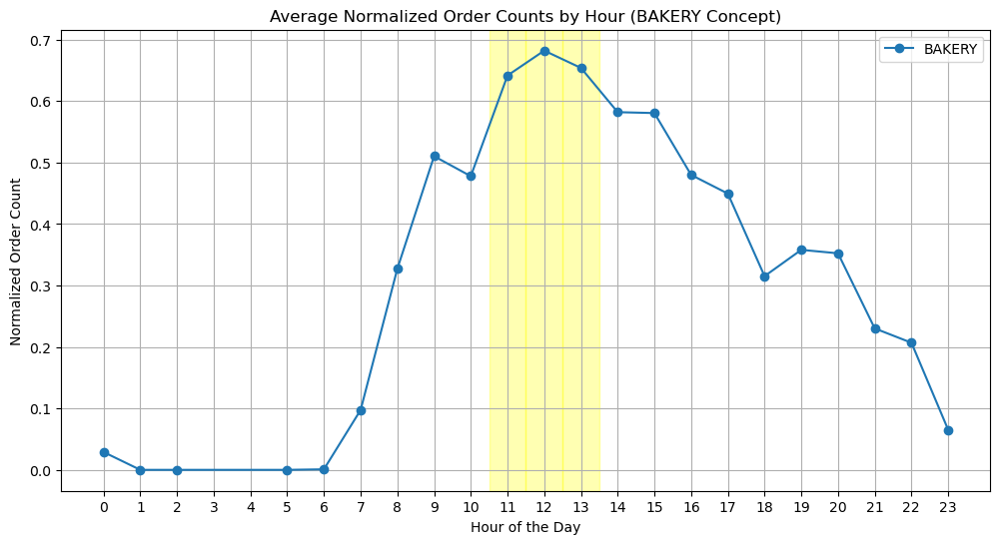

Peak hours for BAKERY concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 12   ┆ 0.682075               │
│ 13   ┆ 0.653923               │
│ 11   ┆ 0.641594               │
└──────┴────────────────────────┘




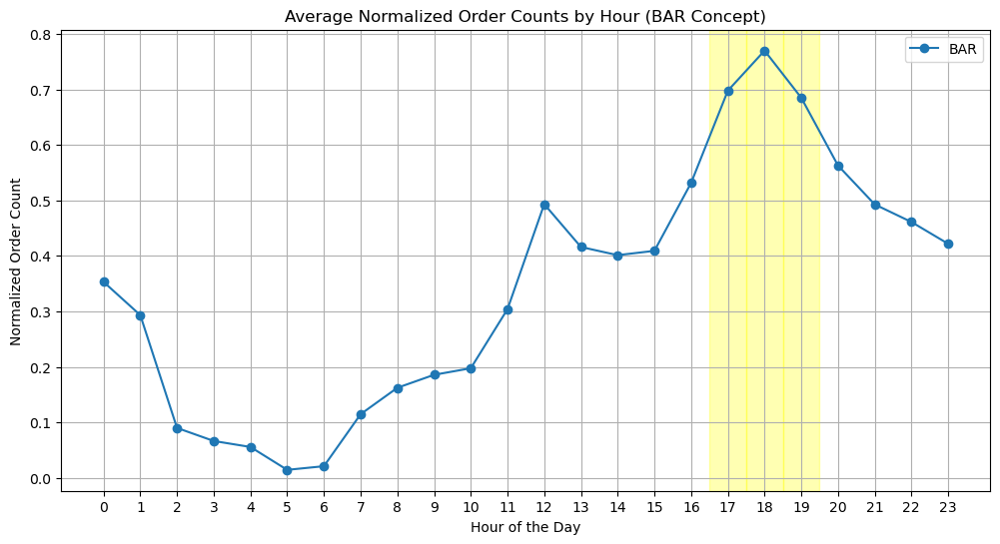

Peak hours for BAR concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.769765               │
│ 17   ┆ 0.697619               │
│ 19   ┆ 0.684777               │
└──────┴────────────────────────┘




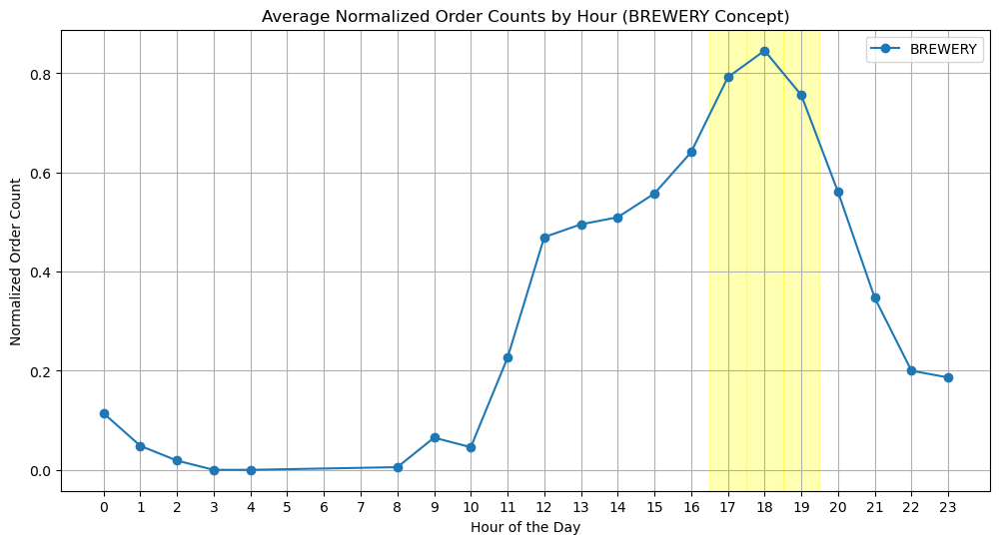

Peak hours for BREWERY concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.845708               │
│ 17   ┆ 0.791958               │
│ 19   ┆ 0.756124               │
└──────┴────────────────────────┘




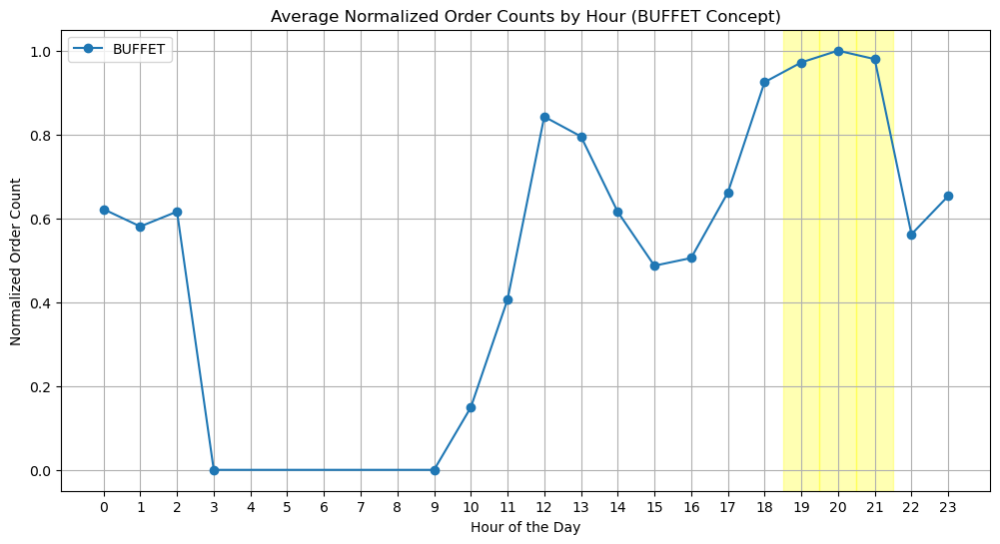

Peak hours for BUFFET concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 20   ┆ 1.0                    │
│ 21   ┆ 0.979742               │
│ 19   ┆ 0.971906               │
└──────┴────────────────────────┘




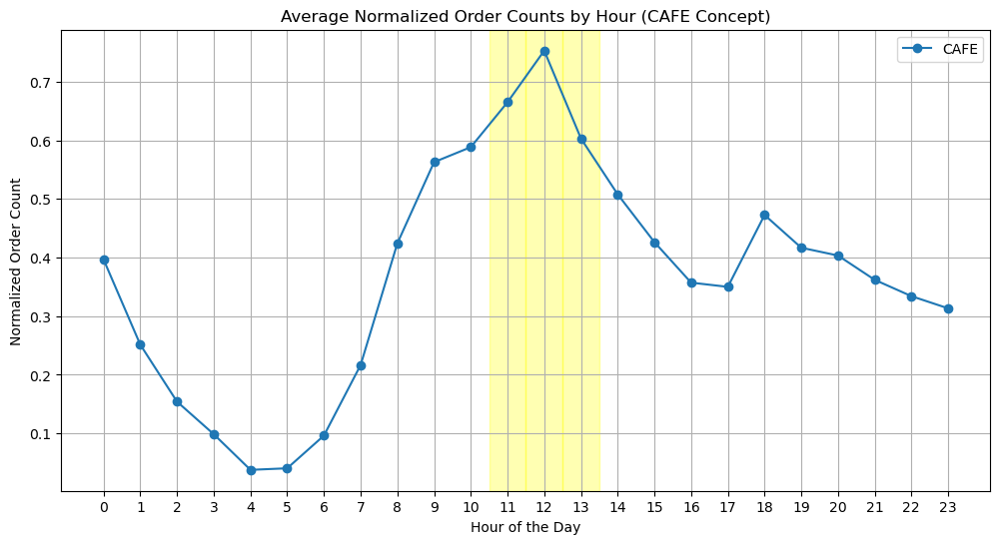

Peak hours for CAFE concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 12   ┆ 0.753011               │
│ 11   ┆ 0.66501                │
│ 13   ┆ 0.603088               │
└──────┴────────────────────────┘




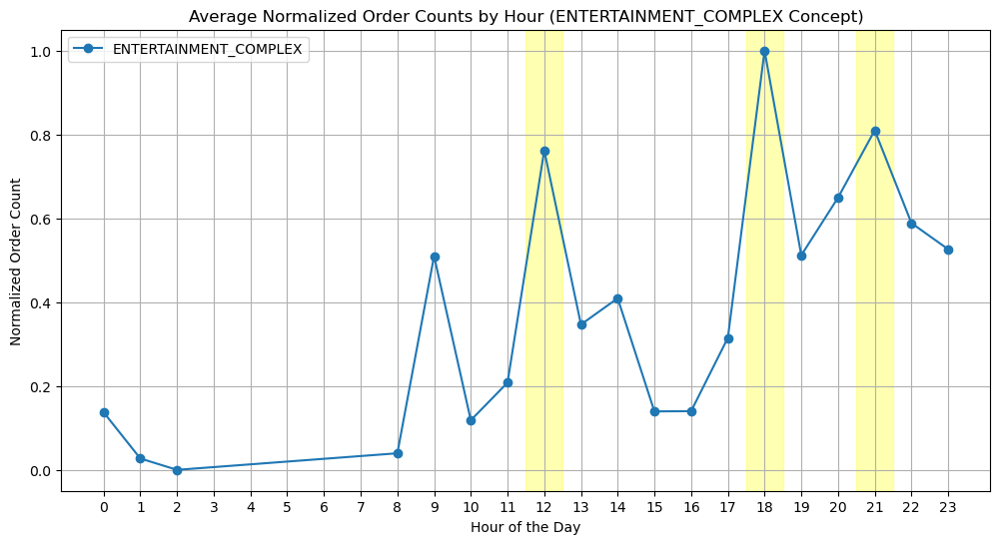

Peak hours for ENTERTAINMENT_COMPLEX concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 1.0                    │
│ 21   ┆ 0.809931               │
│ 12   ┆ 0.76202                │
└──────┴────────────────────────┘




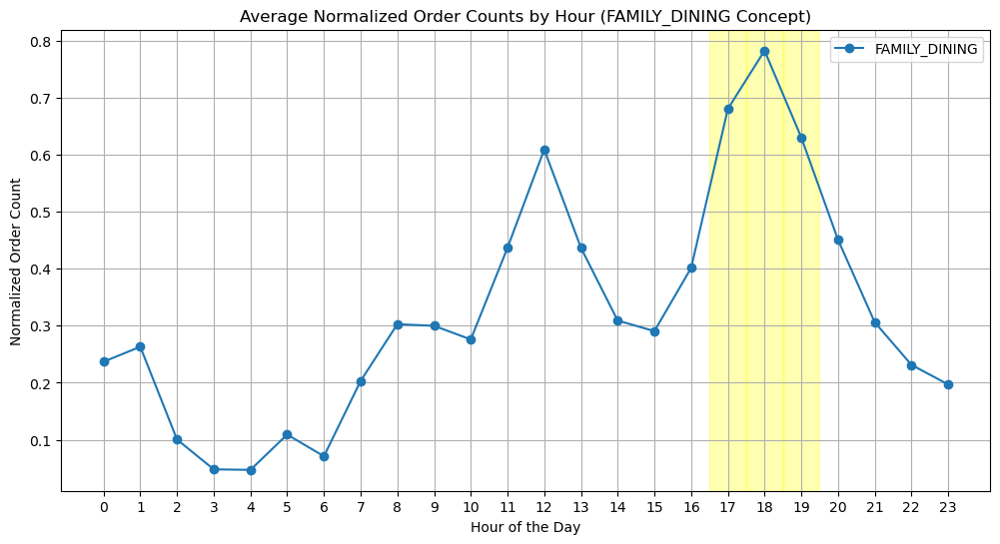

Peak hours for FAMILY_DINING concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.782556               │
│ 17   ┆ 0.680308               │
│ 19   ┆ 0.630204               │
└──────┴────────────────────────┘




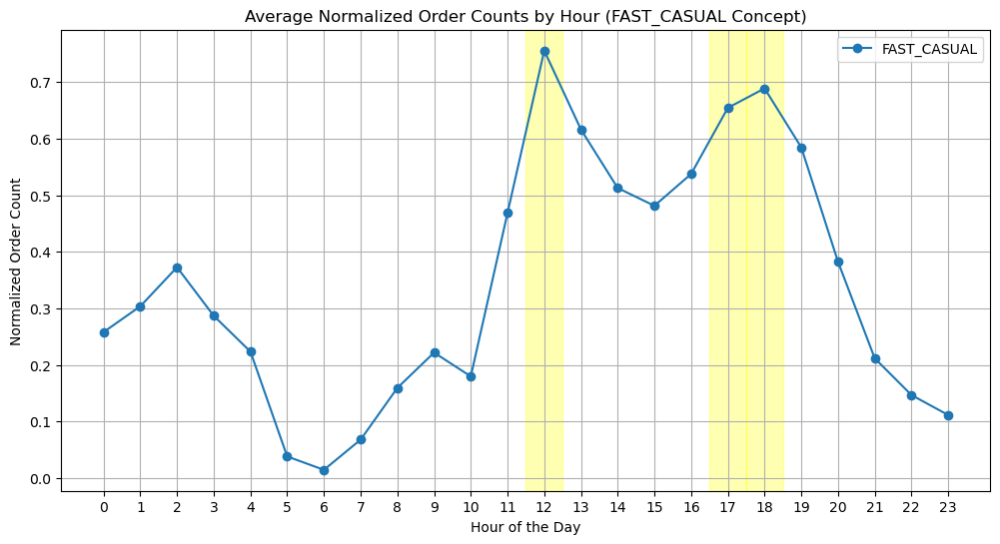

Peak hours for FAST_CASUAL concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 12   ┆ 0.755621               │
│ 18   ┆ 0.688826               │
│ 17   ┆ 0.654426               │
└──────┴────────────────────────┘




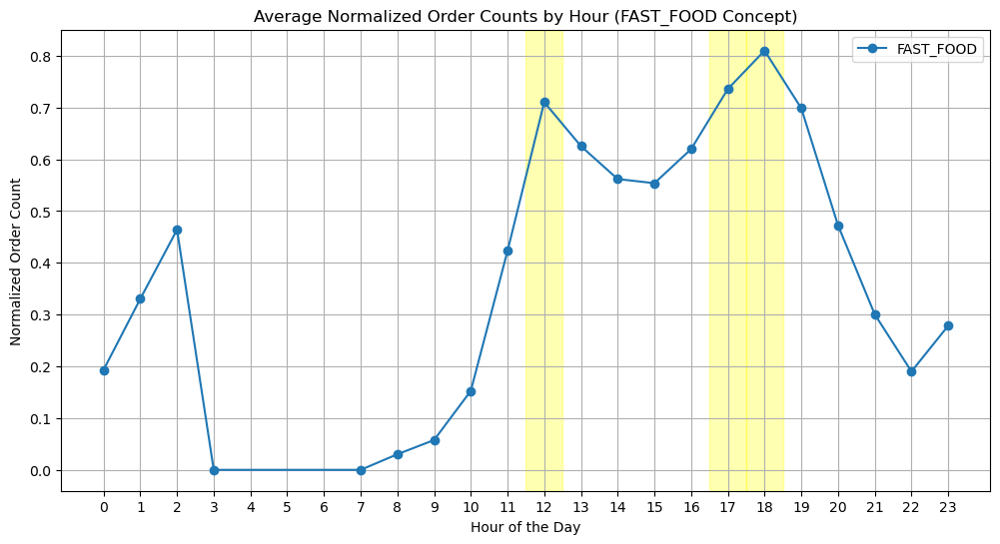

Peak hours for FAST_FOOD concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.809799               │
│ 17   ┆ 0.735739               │
│ 12   ┆ 0.710214               │
└──────┴────────────────────────┘




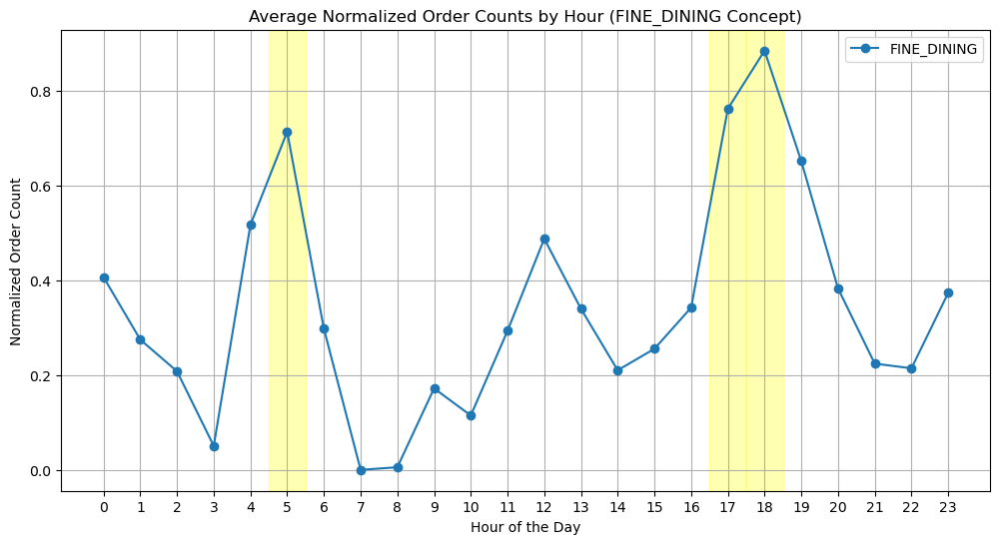

Peak hours for FINE_DINING concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.885673               │
│ 17   ┆ 0.762713               │
│ 5    ┆ 0.714286               │
└──────┴────────────────────────┘




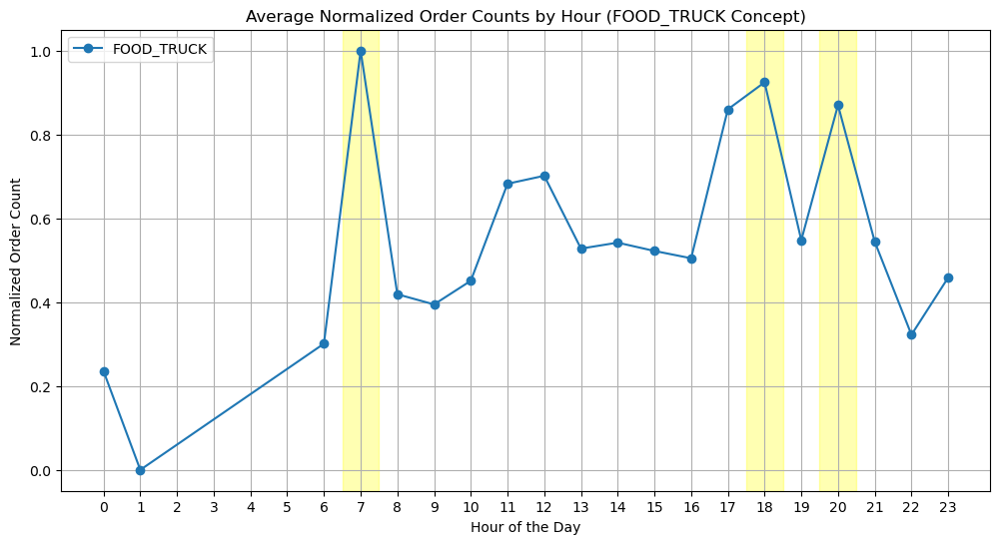

Peak hours for FOOD_TRUCK concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 7    ┆ 1.0                    │
│ 18   ┆ 0.924481               │
│ 20   ┆ 0.870063               │
└──────┴────────────────────────┘




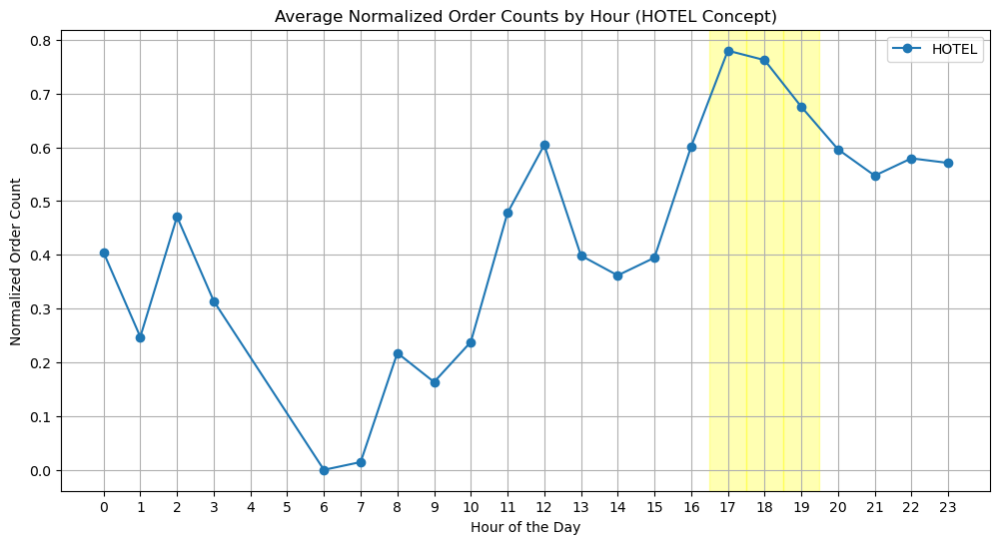

Peak hours for HOTEL concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 17   ┆ 0.779963               │
│ 18   ┆ 0.762368               │
│ 19   ┆ 0.675583               │
└──────┴────────────────────────┘




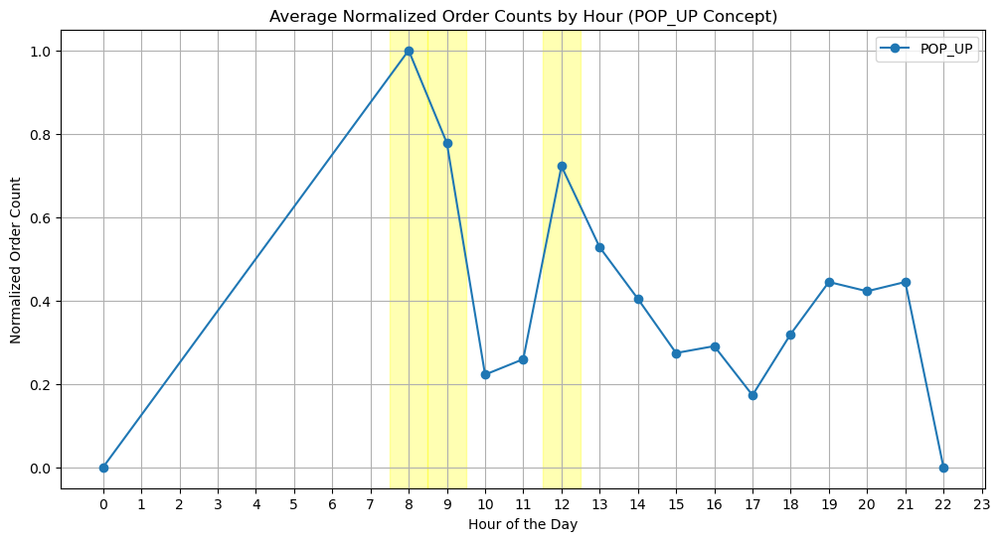

Peak hours for POP_UP concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 8    ┆ 1.0                    │
│ 9    ┆ 0.777778               │
│ 12   ┆ 0.722222               │
└──────┴────────────────────────┘




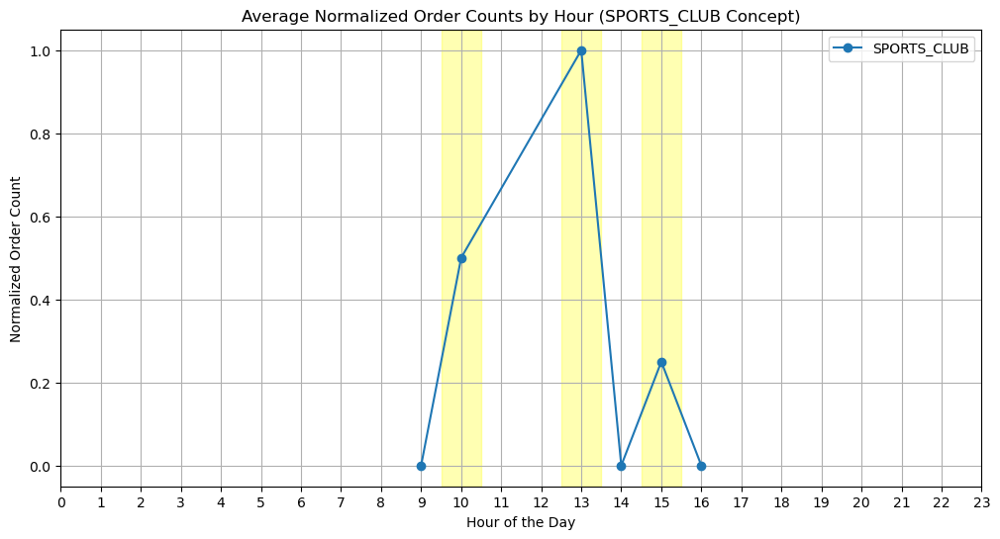

Peak hours for SPORTS_CLUB concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 13   ┆ 1.0                    │
│ 10   ┆ 0.5                    │
│ 15   ┆ 0.25                   │
└──────┴────────────────────────┘




In [44]:
import matplotlib.pyplot as plt

# Aggregate by concept and hour
concept_hourly_avg = (
    average_hourly_order_counts
    .group_by(['concept', 'hour'])
    .agg(pl.mean('normalized_order_count').alias('normalized_order_count'))
    .sort(['concept', 'hour'])
)

# Iterate over each unique concept and generate plots
concepts = concept_hourly_avg.select('concept').unique().to_series().to_list()

for concept in concepts:
    plt.figure(figsize=(12, 6))
    concept_data = concept_hourly_avg.filter(pl.col('concept') == concept)
    
    # Plot the data
    plt.plot(concept_data['hour'], concept_data['normalized_order_count'], marker='o', label=concept)
    
    # Find peak hours (e.g., top 3 busiest hours)
    peak_hours = concept_data.sort('normalized_order_count', descending=True).head(3)
    
    # Highlight and shade the peak hours
    for row in peak_hours.iter_rows(named=True):
        plt.axvspan(row['hour'] - 0.5, row['hour'] + 0.5, color='yellow', alpha=0.3)
    
    plt.title(f'Average Normalized Order Counts by Hour ({concept} Concept)')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Normalized Order Count')
    plt.grid(True)
    plt.xticks(range(0, 24))  # Ensure all hours are displayed
    plt.legend()
    plt.show()

    print(f"Peak hours for {concept} concept:")
    print(peak_hours[['hour', 'normalized_order_count']])
    print("\n" + "="*40 + "\n")


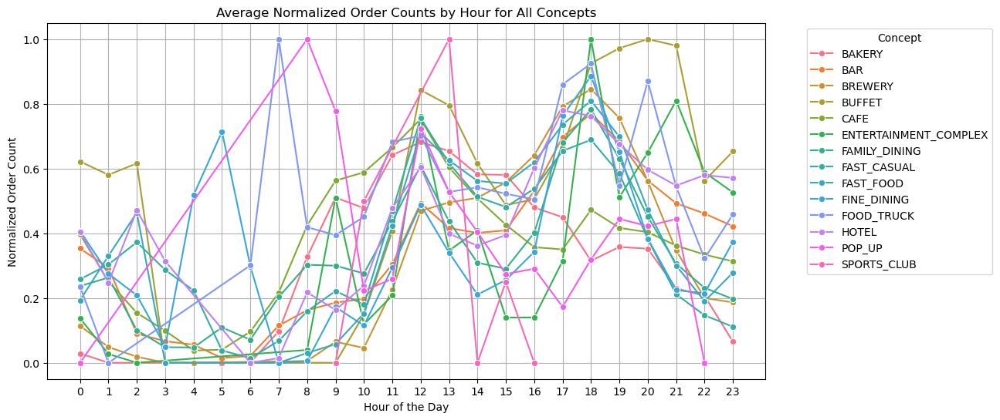

Peak hours for each concept:
shape: (14, 3)
┌─────────────┬──────────────┬────────────────────────────────┐
│ concept     ┆ peak_hours   ┆ peak_counts                    │
│ ---         ┆ ---          ┆ ---                            │
│ str         ┆ list[i8]     ┆ list[f64]                      │
╞═════════════╪══════════════╪════════════════════════════════╡
│ BAKERY      ┆ [12, 13, 11] ┆ [0.682075, 0.653923, 0.641594] │
│ BAR         ┆ [18, 17, 19] ┆ [0.769765, 0.697619, 0.684777] │
│ BREWERY     ┆ [18, 17, 19] ┆ [0.845708, 0.791958, 0.756124] │
│ BUFFET      ┆ [20, 21, 19] ┆ [1.0, 0.979742, 0.971906]      │
│ CAFE        ┆ [12, 11, 13] ┆ [0.753011, 0.66501, 0.603088]  │
│ …           ┆ …            ┆ …                              │
│ FINE_DINING ┆ [18, 17, 5]  ┆ [0.885673, 0.762713, 0.714286] │
│ FOOD_TRUCK  ┆ [7, 18, 20]  ┆ [1.0, 0.924481, 0.870063]      │
│ HOTEL       ┆ [17, 18, 19] ┆ [0.779963, 0.762368, 0.675583] │
│ POP_UP      ┆ [8, 9, 12]   ┆ [1.0, 0.777778, 0.722222]    

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt

# Aggregate by concept and hour
concept_hourly_avg = (
    average_hourly_order_counts
    .group_by(['concept', 'hour'])
    .agg(pl.mean('normalized_order_count').alias('normalized_order_count'))
    .sort(['concept', 'hour'])
)

# Convert to pandas for seaborn compatibility
concept_hourly_avg_pd = concept_hourly_avg.to_pandas()

# Plot all concepts together
plt.figure(figsize=(12, 6))
sns.lineplot(data=concept_hourly_avg_pd, x='hour', y='normalized_order_count', hue='concept', marker='o')

plt.title('Average Normalized Order Counts by Hour for All Concepts')
plt.xlabel('Hour of the Day')
plt.ylabel('Normalized Order Count')
plt.grid(True)
plt.xticks(range(0, 24))  # Ensure all hours are displayed
plt.legend(title="Concept", bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside for better readability
plt.show()

# Find peak hours for each concept (top 3 busiest hours)
peak_hours_per_concept = (
    concept_hourly_avg
    .group_by('concept')
    .agg([
        pl.col('hour').sort_by(pl.col('normalized_order_count'), descending=True).head(3).alias('peak_hours'),
        pl.col('normalized_order_count').sort_by(pl.col('normalized_order_count'), descending=True).head(3).alias('peak_counts')
    ])
)

print("Peak hours for each concept:")
print(peak_hours_per_concept.select(['concept', 'peak_hours', 'peak_counts']))


## Segmentation

### K-Means

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "c:\Users\Natha\miniconda3\envs\polars_env\lib\subprocess.py", line 503, in run
    with Popen(*popenargs, **kwargs) as process:
  File "c:\Users\Natha\miniconda3\envs\polars_env\lib\subprocess.py", line 971, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\Natha\miniconda3\envs\polars_env\lib\subprocess.py", line 1456, in _execute_child
    hp, ht, pid, tid = _

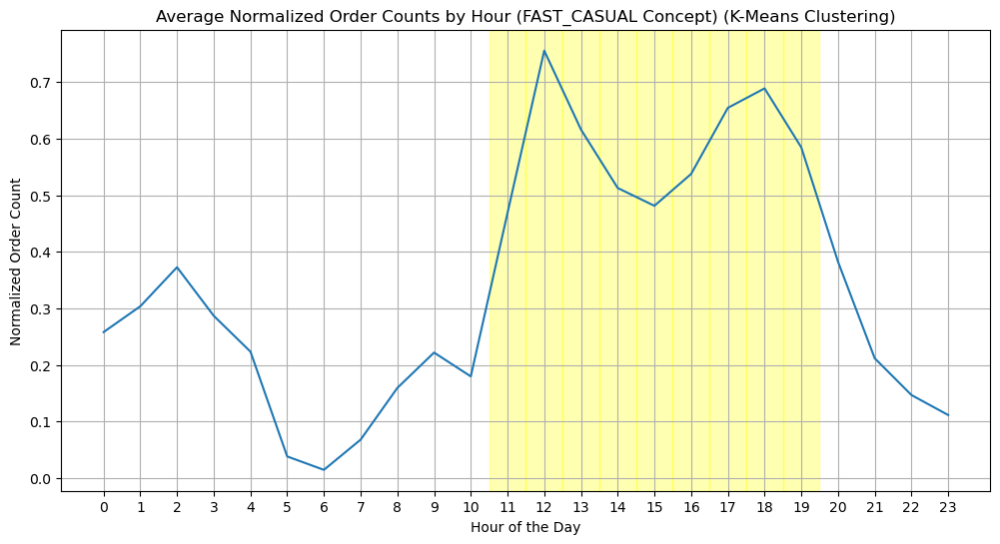

Peak hours for FAST_CASUAL concept (Clustered Approach):
shape: (9, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 13   ┆ 0.616157               │
│ 14   ┆ 0.512754               │
│ 12   ┆ 0.755621               │
│ 11   ┆ 0.468539               │
│ 18   ┆ 0.688826               │
│ 17   ┆ 0.654426               │
│ 16   ┆ 0.537534               │
│ 15   ┆ 0.481255               │
│ 19   ┆ 0.584537               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


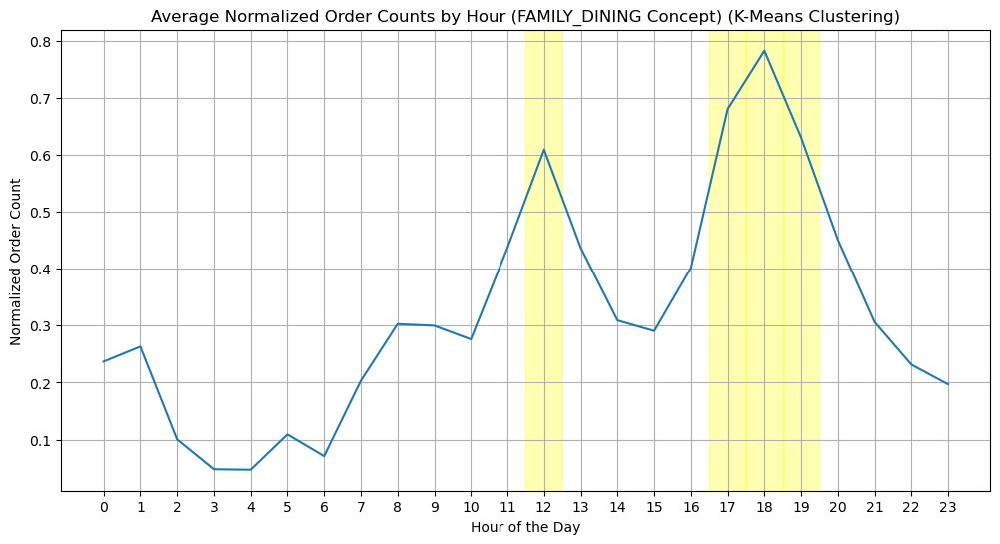

Peak hours for FAMILY_DINING concept (Clustered Approach):
shape: (4, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 17   ┆ 0.680308               │
│ 19   ┆ 0.630204               │
│ 18   ┆ 0.782556               │
│ 12   ┆ 0.609228               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


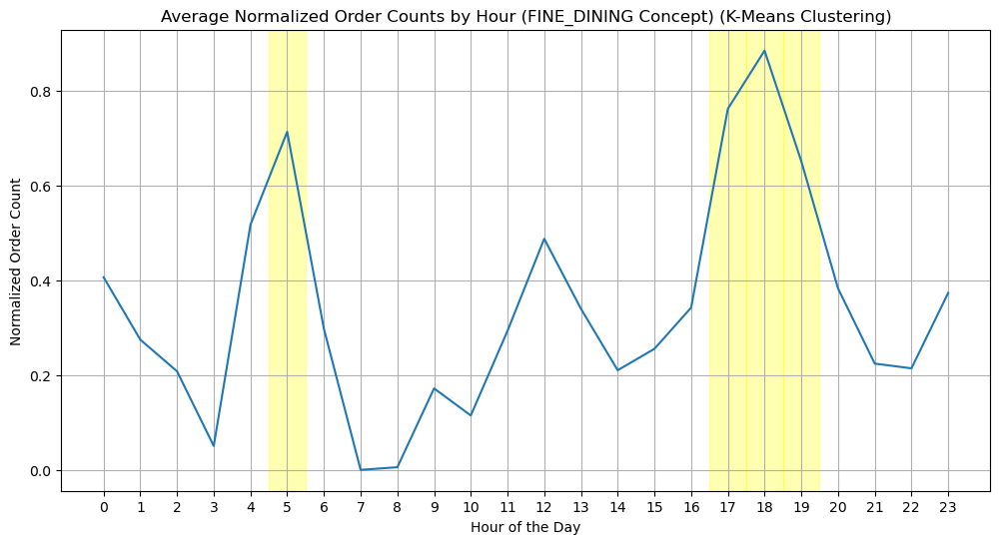

Peak hours for FINE_DINING concept (Clustered Approach):
shape: (4, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 5    ┆ 0.714286               │
│ 17   ┆ 0.762713               │
│ 18   ┆ 0.885673               │
│ 19   ┆ 0.652102               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


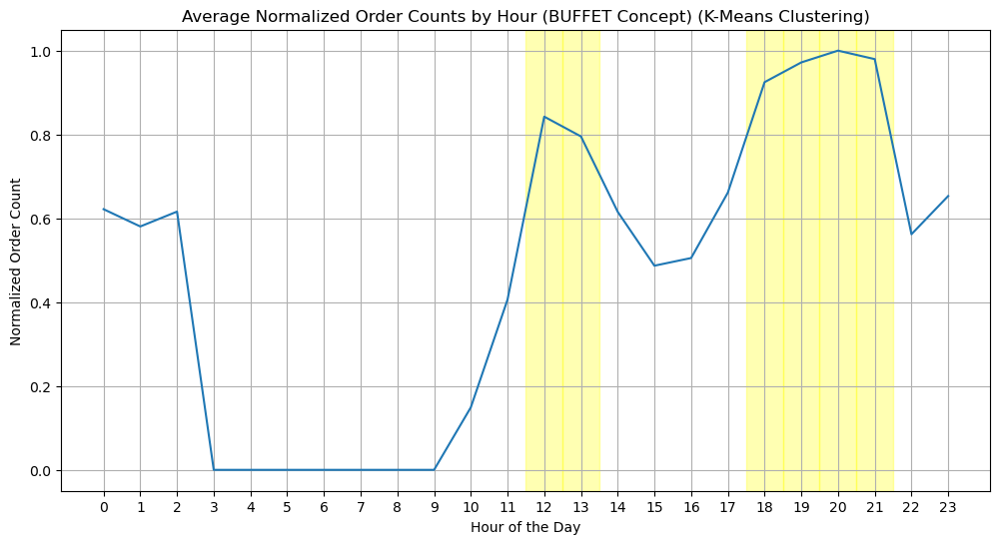

Peak hours for BUFFET concept (Clustered Approach):
shape: (6, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 20   ┆ 1.0                    │
│ 12   ┆ 0.842524               │
│ 18   ┆ 0.924776               │
│ 19   ┆ 0.971906               │
│ 13   ┆ 0.795338               │
│ 21   ┆ 0.979742               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


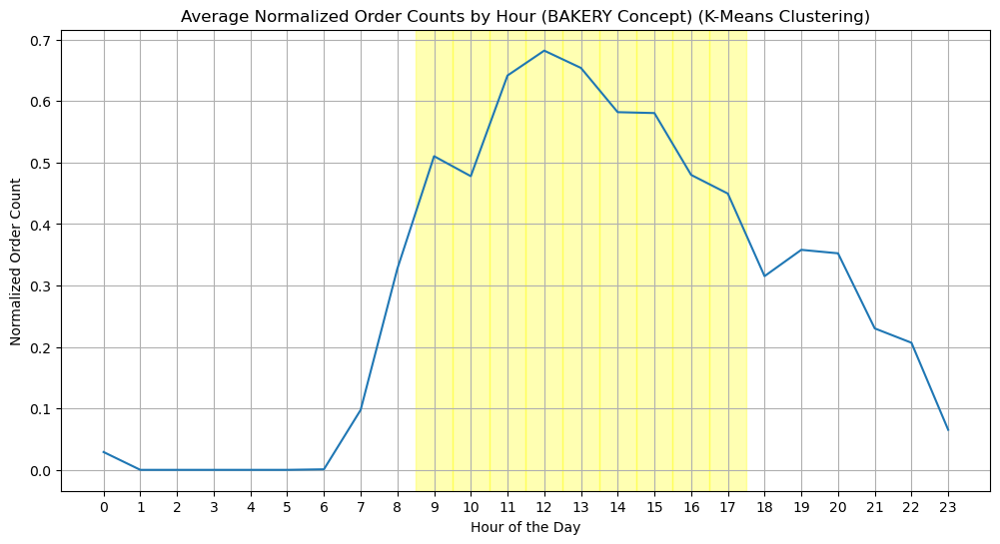

Peak hours for BAKERY concept (Clustered Approach):
shape: (9, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 12   ┆ 0.682075               │
│ 14   ┆ 0.581964               │
│ 11   ┆ 0.641594               │
│ 16   ┆ 0.479892               │
│ 10   ┆ 0.477816               │
│ 15   ┆ 0.580519               │
│ 13   ┆ 0.653923               │
│ 9    ┆ 0.510325               │
│ 17   ┆ 0.449488               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


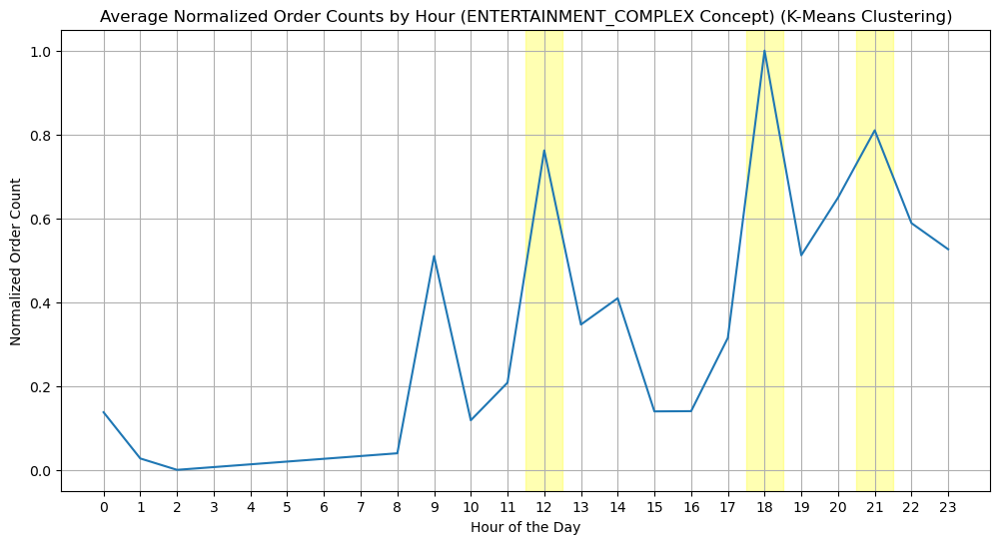

Peak hours for ENTERTAINMENT_COMPLEX concept (Clustered Approach):
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 1.0                    │
│ 21   ┆ 0.809931               │
│ 12   ┆ 0.76202                │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


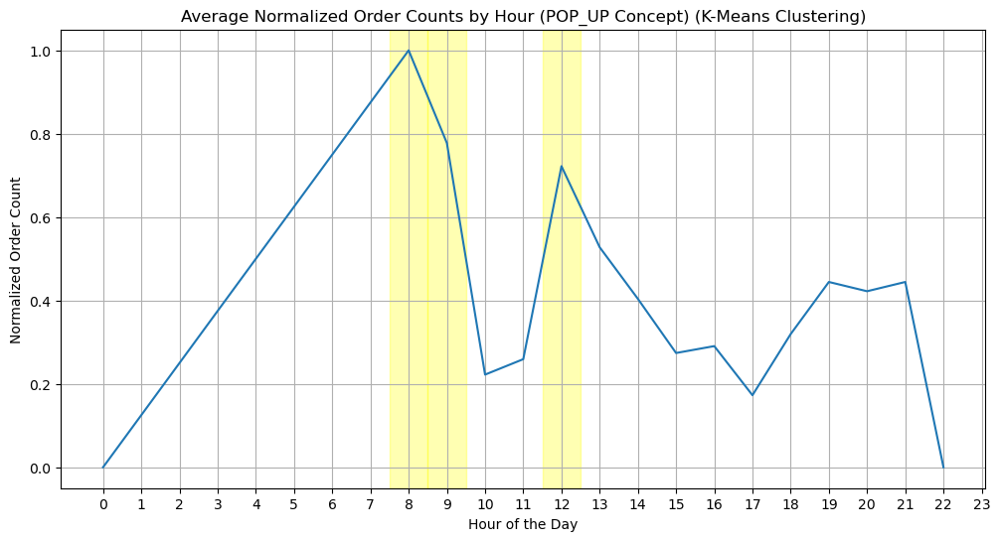

Peak hours for POP_UP concept (Clustered Approach):
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 9    ┆ 0.777778               │
│ 8    ┆ 1.0                    │
│ 12   ┆ 0.722222               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


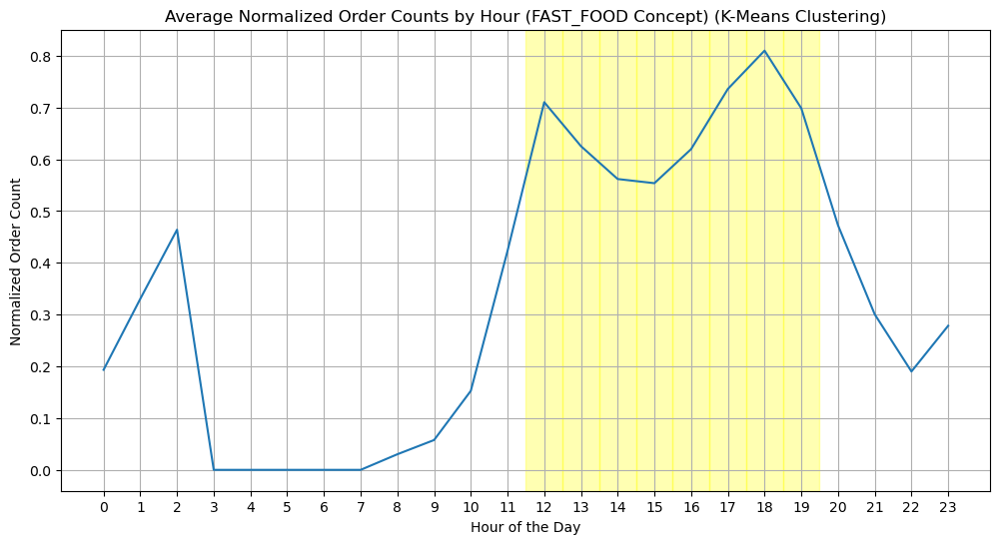

Peak hours for FAST_FOOD concept (Clustered Approach):
shape: (8, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 14   ┆ 0.561782               │
│ 16   ┆ 0.619553               │
│ 12   ┆ 0.710214               │
│ 18   ┆ 0.809799               │
│ 13   ┆ 0.625284               │
│ 15   ┆ 0.553752               │
│ 17   ┆ 0.735739               │
│ 19   ┆ 0.69848                │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


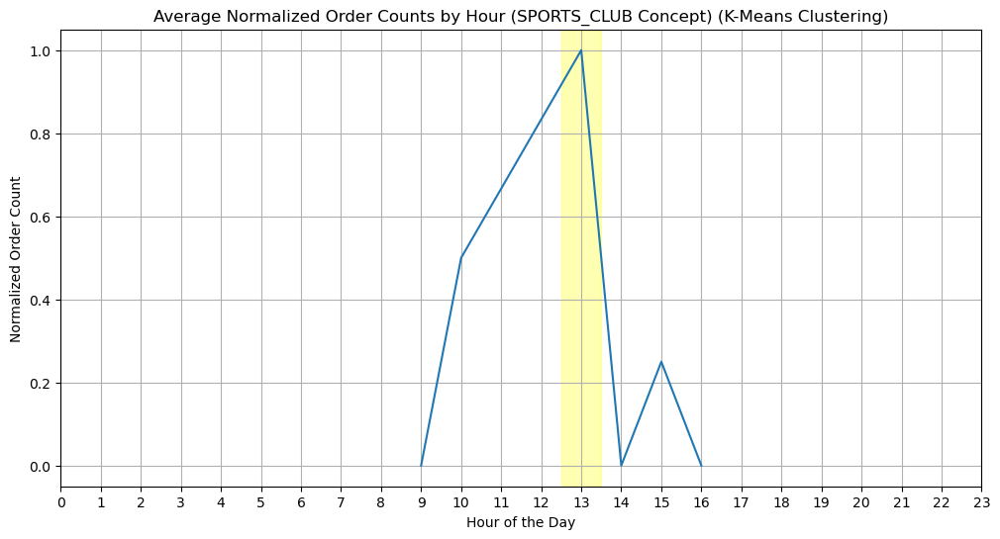

Peak hours for SPORTS_CLUB concept (Clustered Approach):
shape: (1, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 13   ┆ 1.0                    │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


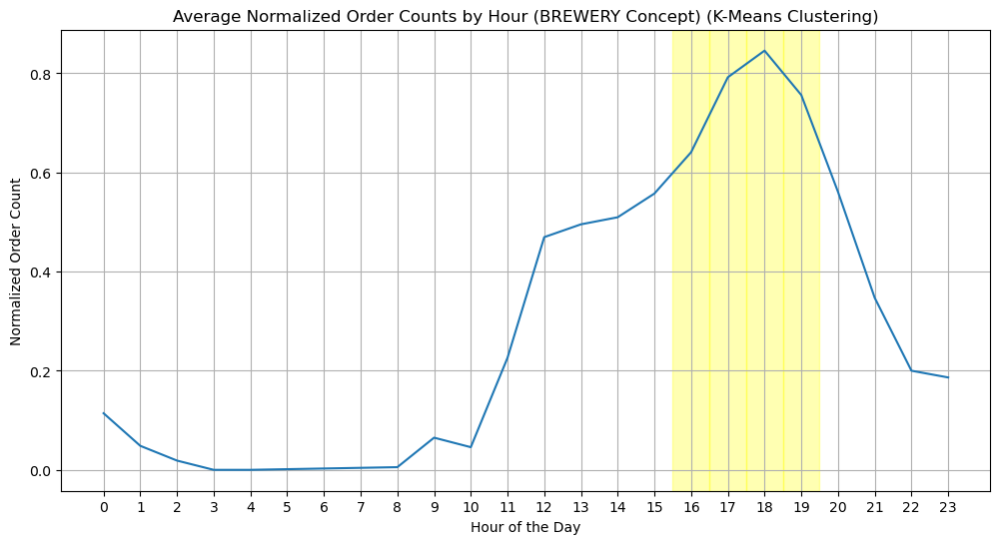

Peak hours for BREWERY concept (Clustered Approach):
shape: (4, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 19   ┆ 0.756124               │
│ 18   ┆ 0.845708               │
│ 17   ┆ 0.791958               │
│ 16   ┆ 0.640791               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


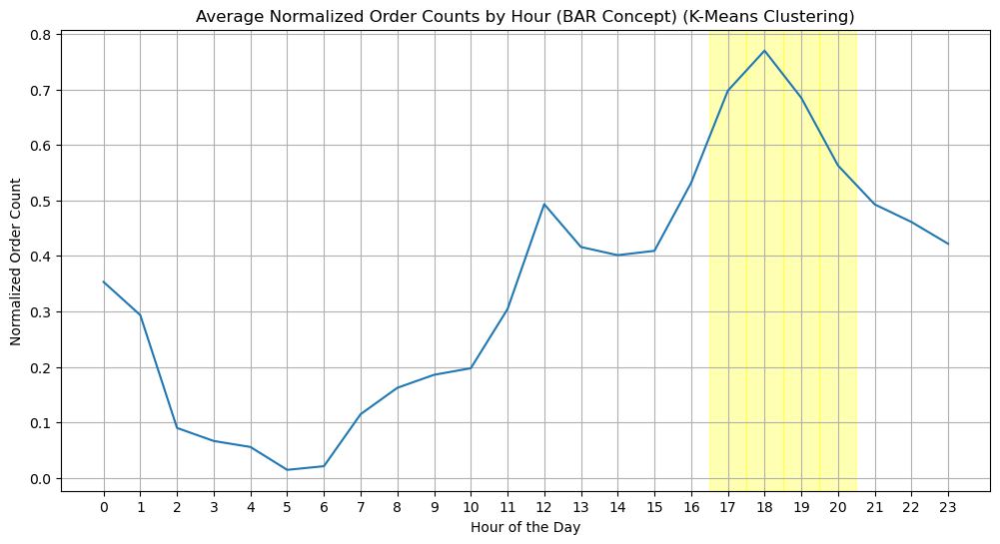

Peak hours for BAR concept (Clustered Approach):
shape: (4, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.769765               │
│ 17   ┆ 0.697619               │
│ 19   ┆ 0.684777               │
│ 20   ┆ 0.562784               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


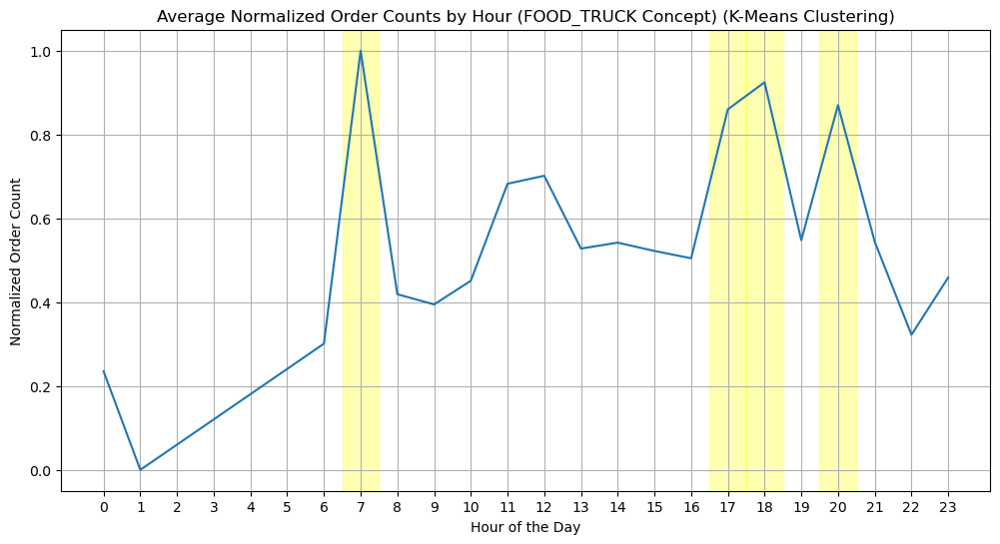

Peak hours for FOOD_TRUCK concept (Clustered Approach):
shape: (4, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 7    ┆ 1.0                    │
│ 17   ┆ 0.859965               │
│ 20   ┆ 0.870063               │
│ 18   ┆ 0.924481               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


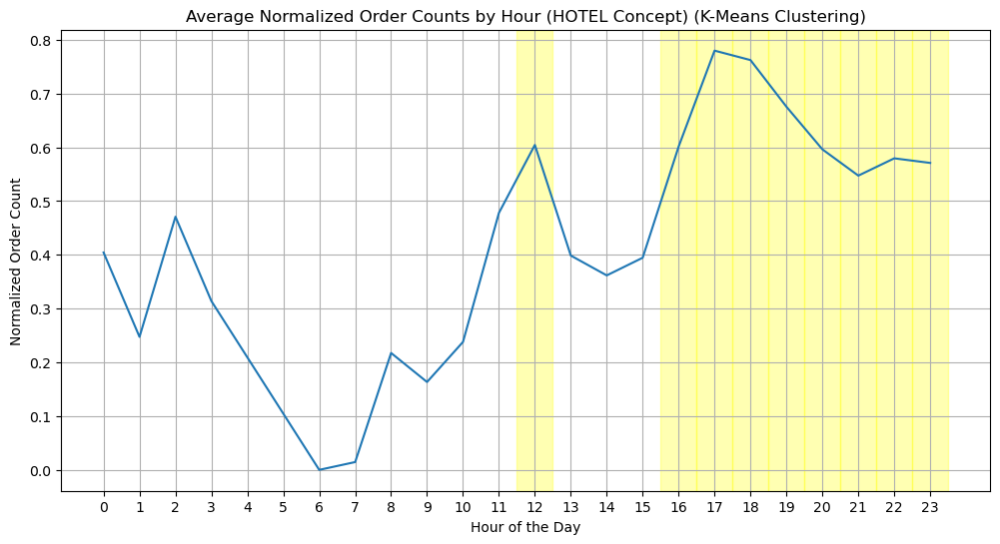

Peak hours for HOTEL concept (Clustered Approach):
shape: (9, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.762368               │
│ 23   ┆ 0.57106                │
│ 20   ┆ 0.596318               │
│ 19   ┆ 0.675583               │
│ 16   ┆ 0.601378               │
│ 12   ┆ 0.604524               │
│ 17   ┆ 0.779963               │
│ 22   ┆ 0.579585               │
│ 21   ┆ 0.547405               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


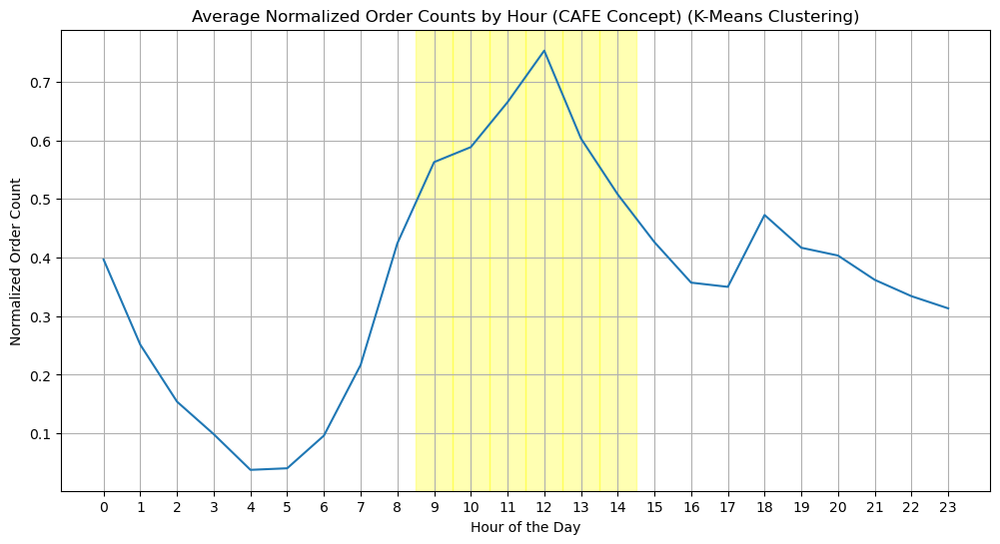

Peak hours for CAFE concept (Clustered Approach):
shape: (6, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 12   ┆ 0.753011               │
│ 11   ┆ 0.66501                │
│ 9    ┆ 0.562824               │
│ 14   ┆ 0.507929               │
│ 13   ┆ 0.603088               │
│ 10   ┆ 0.588409               │
└──────┴────────────────────────┘




In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Group by concept and hour, then calculate the mean normalized order count
concept_hourly_avg = (
    average_hourly_order_counts
    .group_by(['concept', 'hour'])
    .agg(pl.mean('normalized_order_count').alias('normalized_order_count'))
)

concepts = concept_hourly_avg.select('concept').unique().to_series().to_list()

for concept in concepts:
    plt.figure(figsize=(12, 6))
    concept_data = concept_hourly_avg.filter(pl.col('concept') == concept)
    
    # Reshape data for clustering
    X = concept_data.select('normalized_order_count').to_numpy()
    
    # Apply KMeans clustering (choosing 3 clusters for peak, mid, low)
    kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
    concept_data = concept_data.with_columns(
        pl.Series(name='cluster', values=kmeans.fit_predict(X))
    )
    
    # Determine which cluster represents peak hours (highest avg order count)
    cluster_means = (
        concept_data
        .group_by('cluster')
        .agg(pl.mean('normalized_order_count').alias('cluster_mean'))
        .sort('cluster_mean', descending=True)
    )
    peak_cluster = cluster_means[0, 'cluster']
    
    # Identify peak hours
    peak_hours = concept_data.filter(pl.col('cluster') == peak_cluster)
    
    # Plot data
    sns.lineplot(
        data=concept_data.to_pandas(),
        x='hour',
        y='normalized_order_count'
    )
    
    # Highlight peak hours
    for row in peak_hours.iter_rows(named=True):
        plt.axvspan(row['hour'] - 0.5, row['hour'] + 0.5, color='yellow', alpha=0.3)
    
    plt.title(f'Average Normalized Order Counts by Hour ({concept} Concept) (K-Means Clustering)')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Normalized Order Count')
    plt.grid(True)
    plt.xticks(range(0, 24))
    plt.show()
    
    print(f"Peak hours for {concept} concept (Clustered Approach):")
    print(peak_hours.select(['hour', 'normalized_order_count']))
    print("\n" + "="*40 + "\n")


### Gaussian Mixture

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


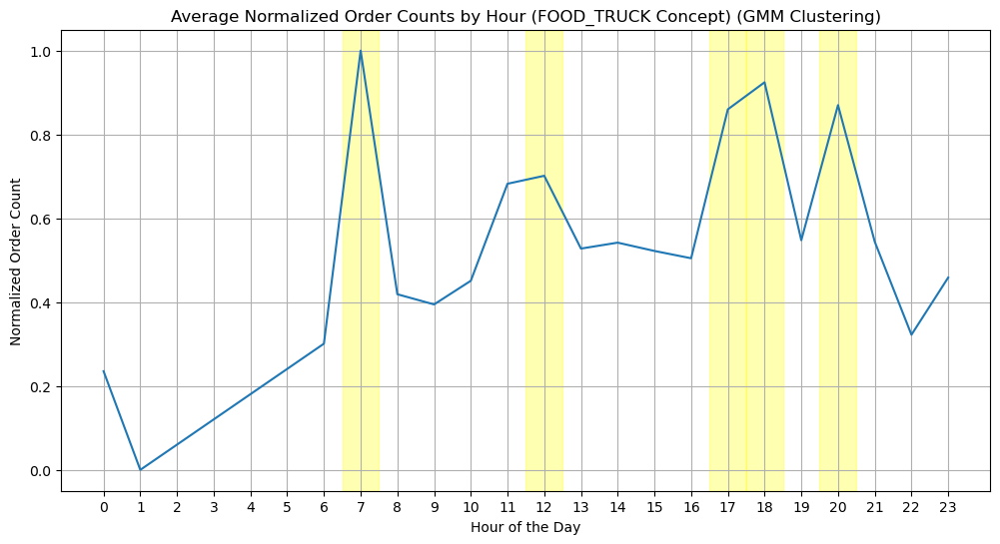

Peak hours for FOOD_TRUCK concept (Clustered Approach):
shape: (5, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.924481               │
│ 7    ┆ 1.0                    │
│ 17   ┆ 0.859965               │
│ 20   ┆ 0.870063               │
│ 12   ┆ 0.701492               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


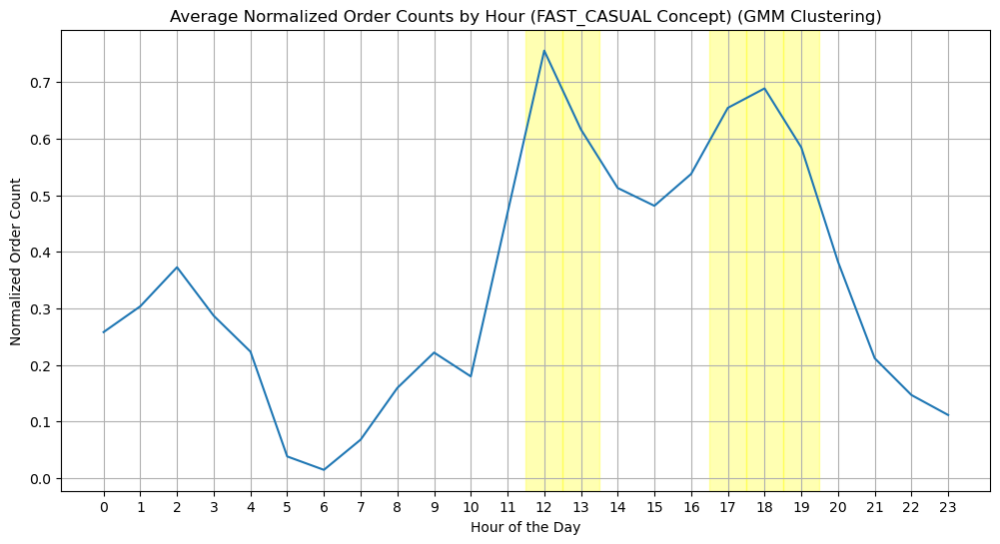

Peak hours for FAST_CASUAL concept (Clustered Approach):
shape: (5, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 17   ┆ 0.654426               │
│ 19   ┆ 0.584537               │
│ 13   ┆ 0.616157               │
│ 12   ┆ 0.755621               │
│ 18   ┆ 0.688826               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


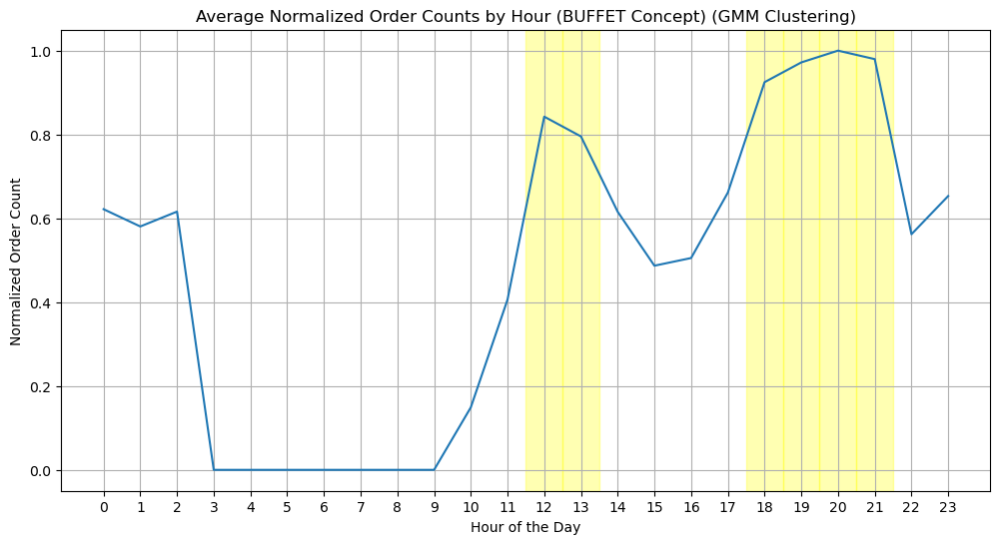

Peak hours for BUFFET concept (Clustered Approach):
shape: (6, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 21   ┆ 0.979742               │
│ 19   ┆ 0.971906               │
│ 20   ┆ 1.0                    │
│ 13   ┆ 0.795338               │
│ 18   ┆ 0.924776               │
│ 12   ┆ 0.842524               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


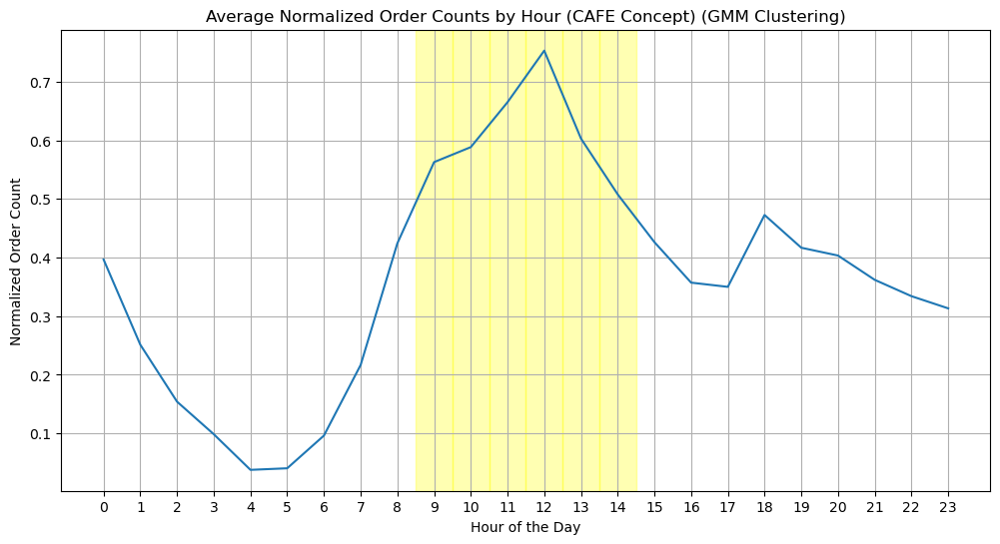

Peak hours for CAFE concept (Clustered Approach):
shape: (6, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 13   ┆ 0.603088               │
│ 9    ┆ 0.562824               │
│ 14   ┆ 0.507929               │
│ 11   ┆ 0.66501                │
│ 12   ┆ 0.753011               │
│ 10   ┆ 0.588409               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


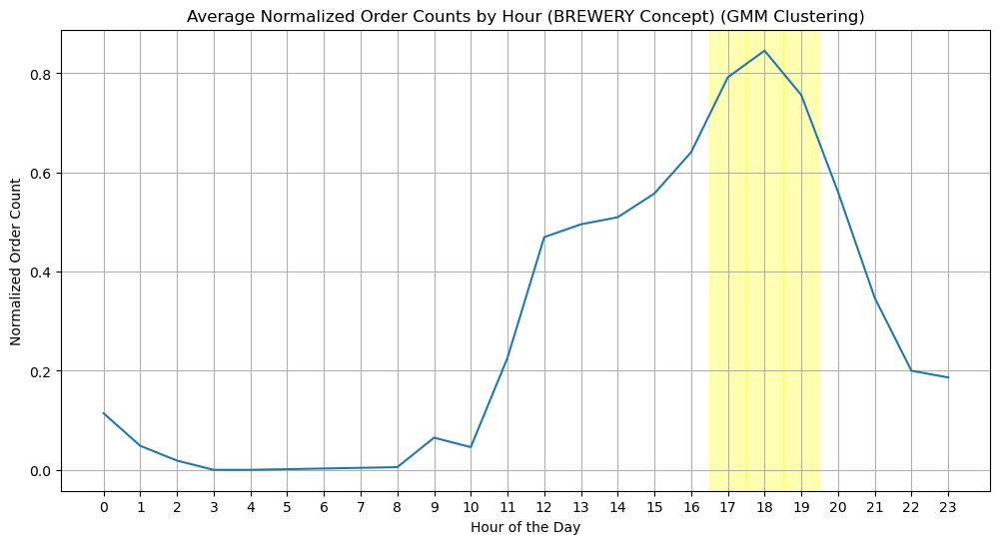

Peak hours for BREWERY concept (Clustered Approach):
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 19   ┆ 0.756124               │
│ 17   ┆ 0.791958               │
│ 18   ┆ 0.845708               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


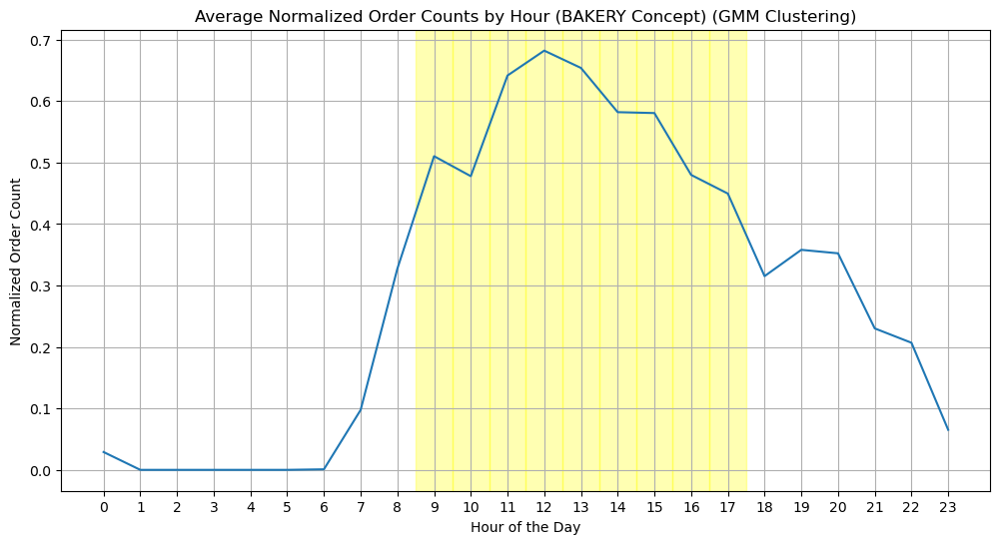

Peak hours for BAKERY concept (Clustered Approach):
shape: (9, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 15   ┆ 0.580519               │
│ 9    ┆ 0.510325               │
│ 12   ┆ 0.682075               │
│ 11   ┆ 0.641594               │
│ 13   ┆ 0.653923               │
│ 16   ┆ 0.479892               │
│ 17   ┆ 0.449488               │
│ 10   ┆ 0.477816               │
│ 14   ┆ 0.581964               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


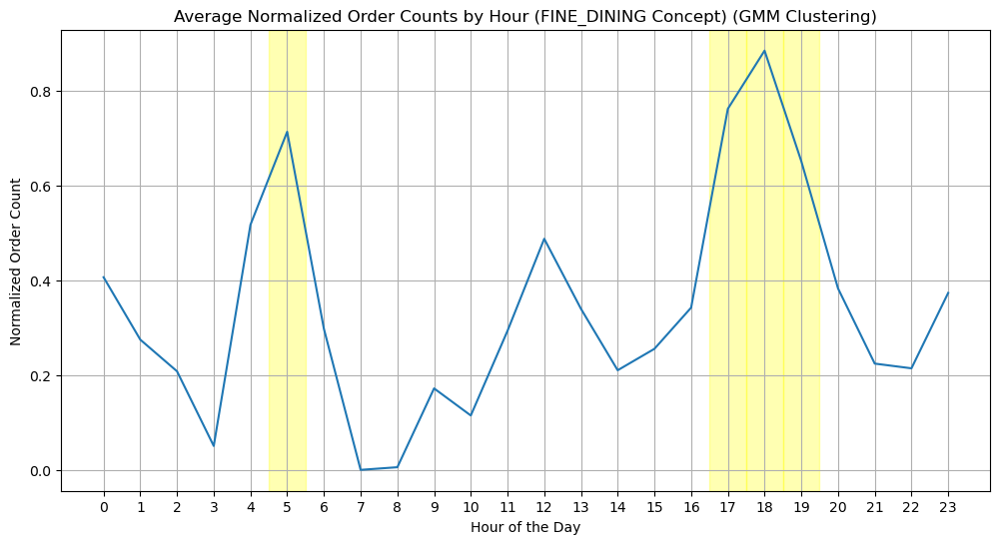

Peak hours for FINE_DINING concept (Clustered Approach):
shape: (4, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 17   ┆ 0.762713               │
│ 18   ┆ 0.885673               │
│ 5    ┆ 0.714286               │
│ 19   ┆ 0.652102               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


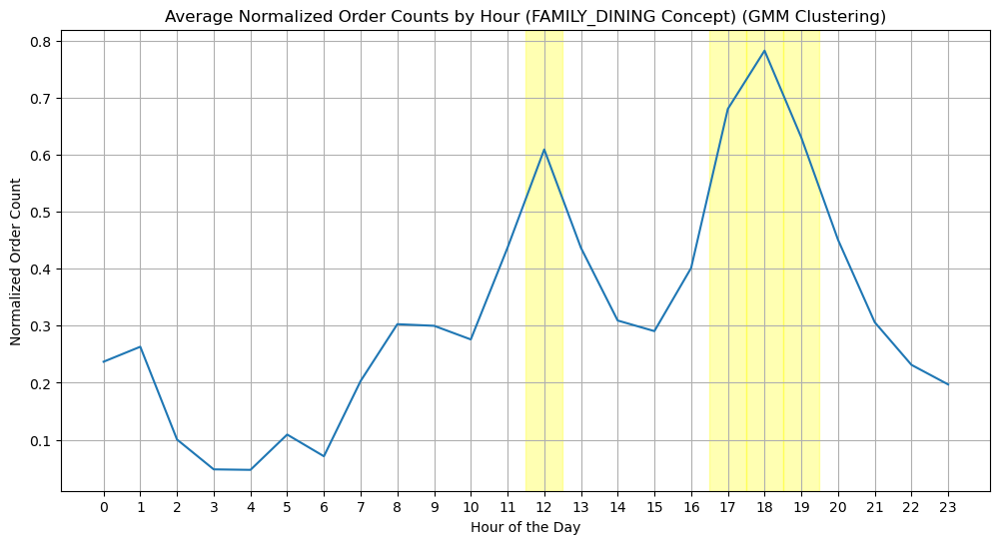

Peak hours for FAMILY_DINING concept (Clustered Approach):
shape: (4, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 19   ┆ 0.630204               │
│ 18   ┆ 0.782556               │
│ 12   ┆ 0.609228               │
│ 17   ┆ 0.680308               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


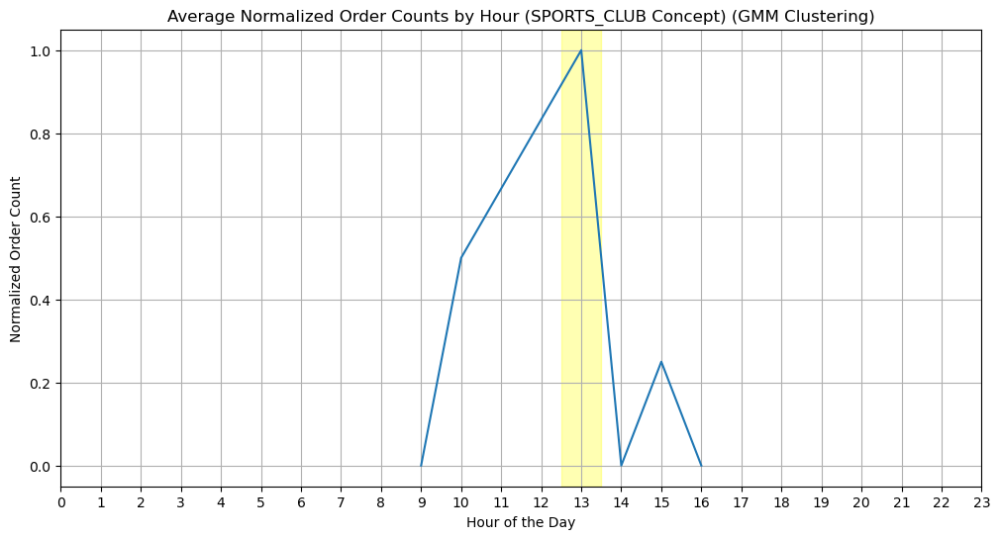

Peak hours for SPORTS_CLUB concept (Clustered Approach):
shape: (1, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 13   ┆ 1.0                    │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


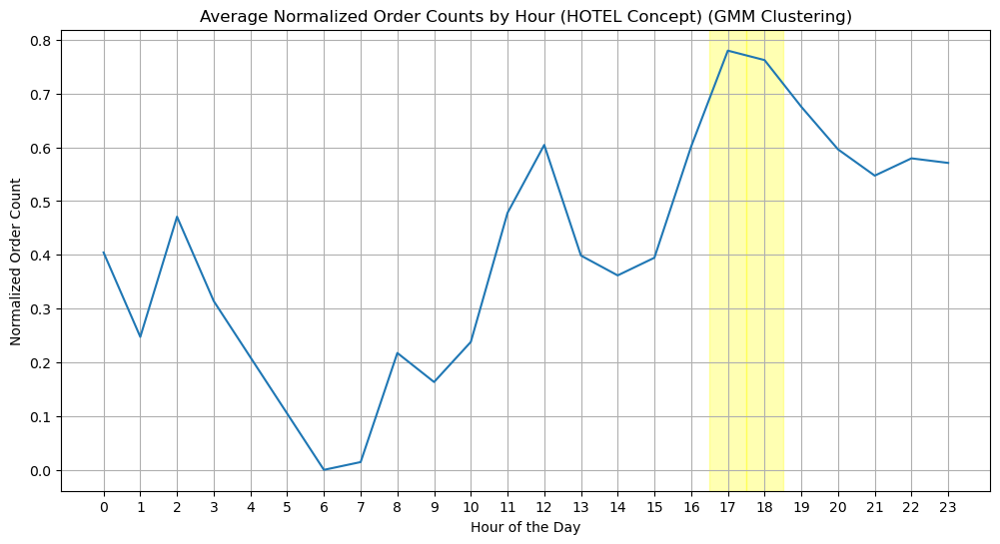

Peak hours for HOTEL concept (Clustered Approach):
shape: (2, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 17   ┆ 0.779963               │
│ 18   ┆ 0.762368               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


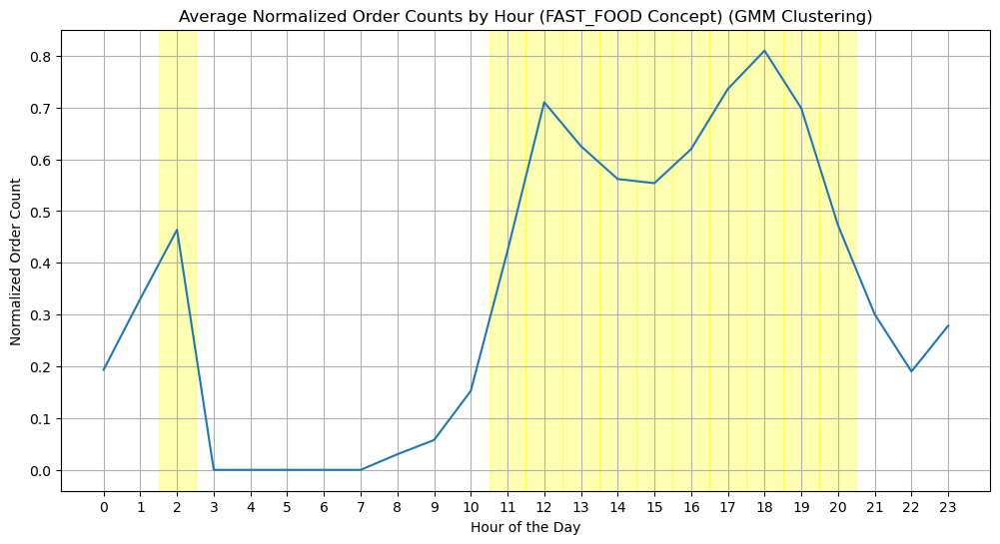

Peak hours for FAST_FOOD concept (Clustered Approach):
shape: (11, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 19   ┆ 0.69848                │
│ 2    ┆ 0.463876               │
│ 14   ┆ 0.561782               │
│ 20   ┆ 0.472464               │
│ 15   ┆ 0.553752               │
│ …    ┆ …                      │
│ 18   ┆ 0.809799               │
│ 12   ┆ 0.710214               │
│ 17   ┆ 0.735739               │
│ 11   ┆ 0.422838               │
│ 16   ┆ 0.619553               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


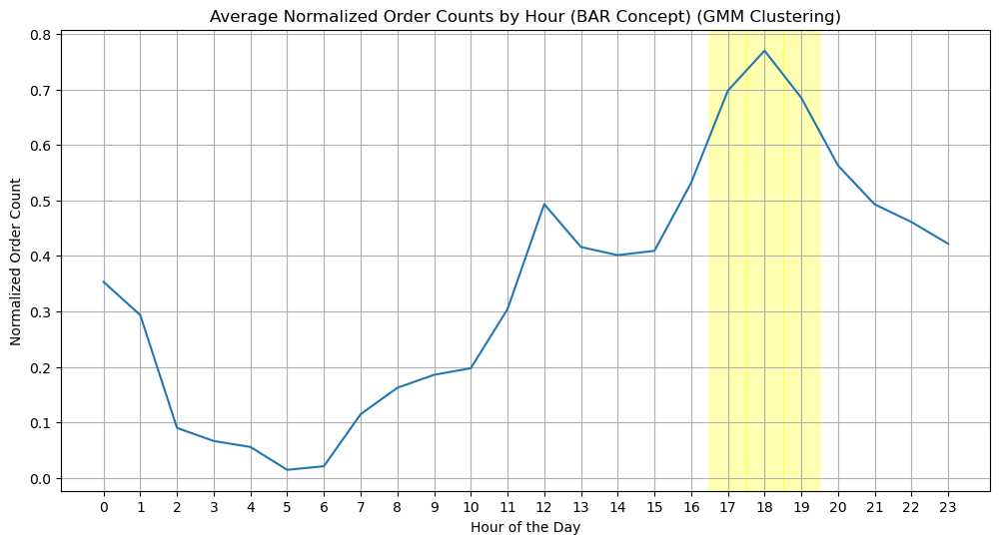

Peak hours for BAR concept (Clustered Approach):
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.769765               │
│ 17   ┆ 0.697619               │
│ 19   ┆ 0.684777               │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


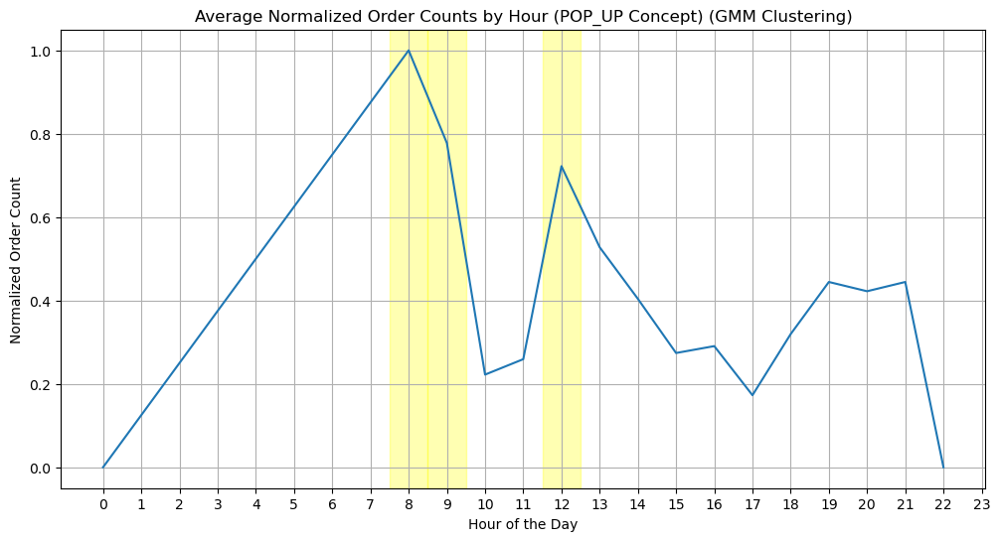

Peak hours for POP_UP concept (Clustered Approach):
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 9    ┆ 0.777778               │
│ 12   ┆ 0.722222               │
│ 8    ┆ 1.0                    │
└──────┴────────────────────────┘




c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


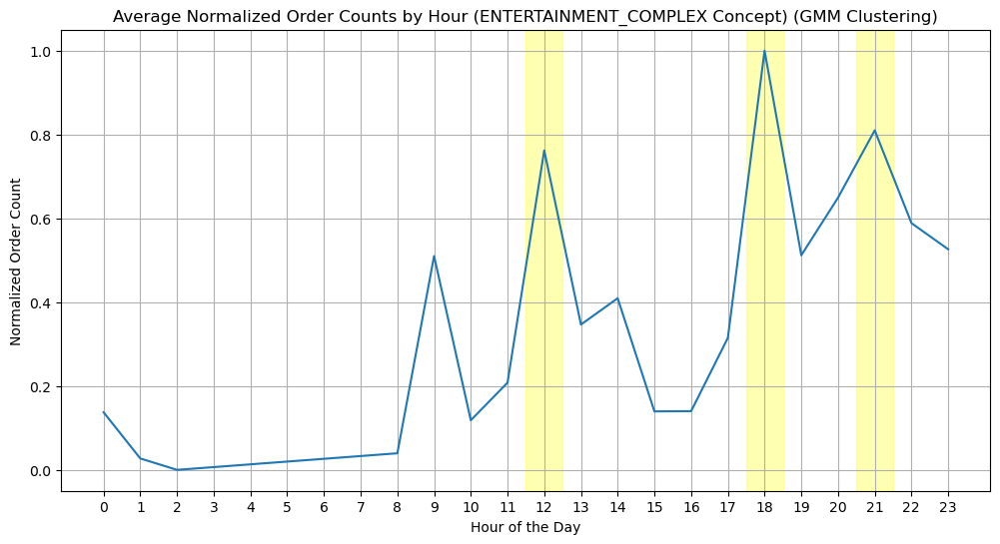

Peak hours for ENTERTAINMENT_COMPLEX concept (Clustered Approach):
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 1.0                    │
│ 12   ┆ 0.76202                │
│ 21   ┆ 0.809931               │
└──────┴────────────────────────┘




In [49]:
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import seaborn as sns

# Group by concept and hour, then calculate the mean normalized order count
concept_hourly_avg = (
    average_hourly_order_counts
    .group_by(['concept', 'hour'])
    .agg(pl.mean('normalized_order_count').alias('normalized_order_count'))
)

concepts = concept_hourly_avg.select('concept').unique().to_series().to_list()

for concept in concepts:
    plt.figure(figsize=(12, 6))
    concept_data = concept_hourly_avg.filter(pl.col('concept') == concept)
    
    # Reshape data for clustering
    X = concept_data.select('normalized_order_count').to_numpy()
    
    # Apply Gaussian Mixture Model (choosing 3 components for peak, mid, low)
    gmm = GaussianMixture(n_components=3, random_state=42)
    concept_data = concept_data.with_columns(
        pl.Series(name='cluster', values=gmm.fit_predict(X))
    )
    
    # Determine which cluster represents peak hours (highest avg order count)
    cluster_means = (
        concept_data
        .group_by('cluster')
        .agg(pl.mean('normalized_order_count').alias('cluster_mean'))
        .sort('cluster_mean', descending=True)
    )
    peak_cluster = cluster_means[0, 'cluster']
    
    # Identify peak hours
    peak_hours = concept_data.filter(pl.col('cluster') == peak_cluster)
    
    # Plot data
    sns.lineplot(
        data=concept_data.to_pandas(),
        x='hour',
        y='normalized_order_count'
    )
    
    # Highlight peak hours
    for row in peak_hours.iter_rows(named=True):
        plt.axvspan(row['hour'] - 0.5, row['hour'] + 0.5, color='yellow', alpha=0.3)
    
    plt.title(f'Average Normalized Order Counts by Hour ({concept} Concept) (GMM Clustering)')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Normalized Order Count')
    plt.grid(True)
    plt.xticks(range(0, 24))
    plt.show()
    
    print(f"Peak hours for {concept} concept (Clustered Approach):")
    print(peak_hours.select(['hour', 'normalized_order_count']))
    print("\n" + "="*40 + "\n")


### Agglo Clustering

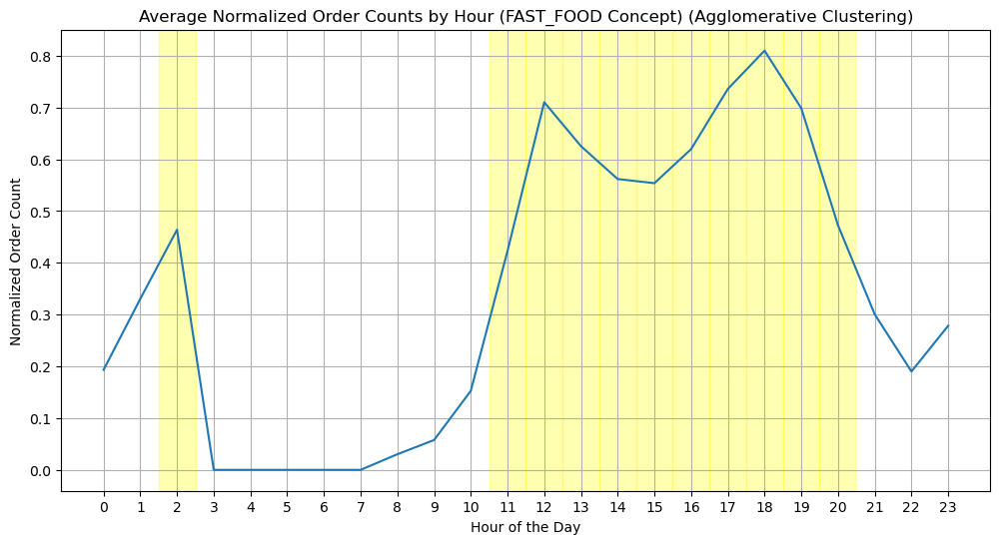

Peak hours for FAST_FOOD concept (Clustered Approach):
shape: (11, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 11   ┆ 0.422838               │
│ 14   ┆ 0.561782               │
│ 17   ┆ 0.735739               │
│ 13   ┆ 0.625284               │
│ 15   ┆ 0.553752               │
│ …    ┆ …                      │
│ 2    ┆ 0.463876               │
│ 19   ┆ 0.69848                │
│ 18   ┆ 0.809799               │
│ 12   ┆ 0.710214               │
│ 20   ┆ 0.472464               │
└──────┴────────────────────────┘




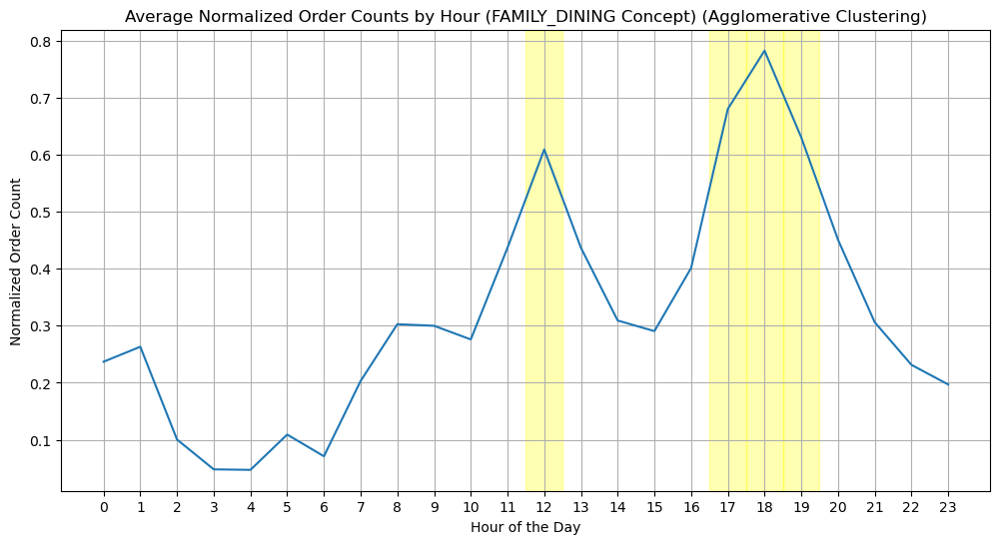

Peak hours for FAMILY_DINING concept (Clustered Approach):
shape: (4, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 12   ┆ 0.609228               │
│ 17   ┆ 0.680308               │
│ 18   ┆ 0.782556               │
│ 19   ┆ 0.630204               │
└──────┴────────────────────────┘




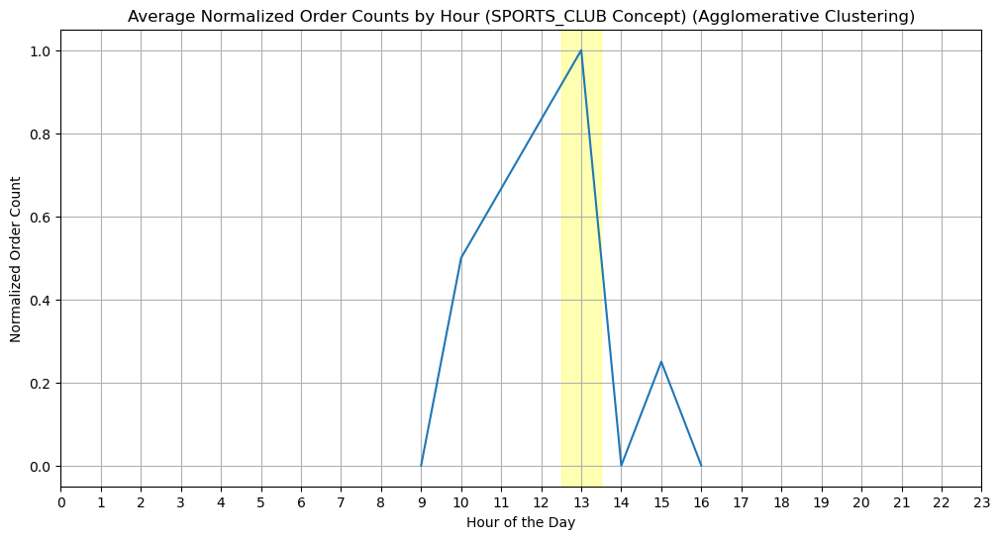

Peak hours for SPORTS_CLUB concept (Clustered Approach):
shape: (1, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 13   ┆ 1.0                    │
└──────┴────────────────────────┘




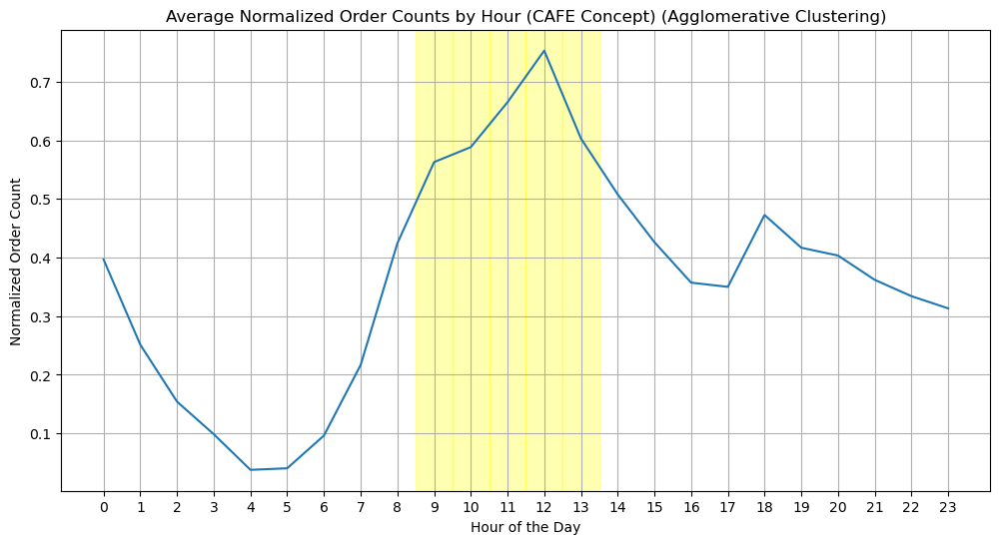

Peak hours for CAFE concept (Clustered Approach):
shape: (5, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 9    ┆ 0.562824               │
│ 13   ┆ 0.603088               │
│ 11   ┆ 0.66501                │
│ 12   ┆ 0.753011               │
│ 10   ┆ 0.588409               │
└──────┴────────────────────────┘




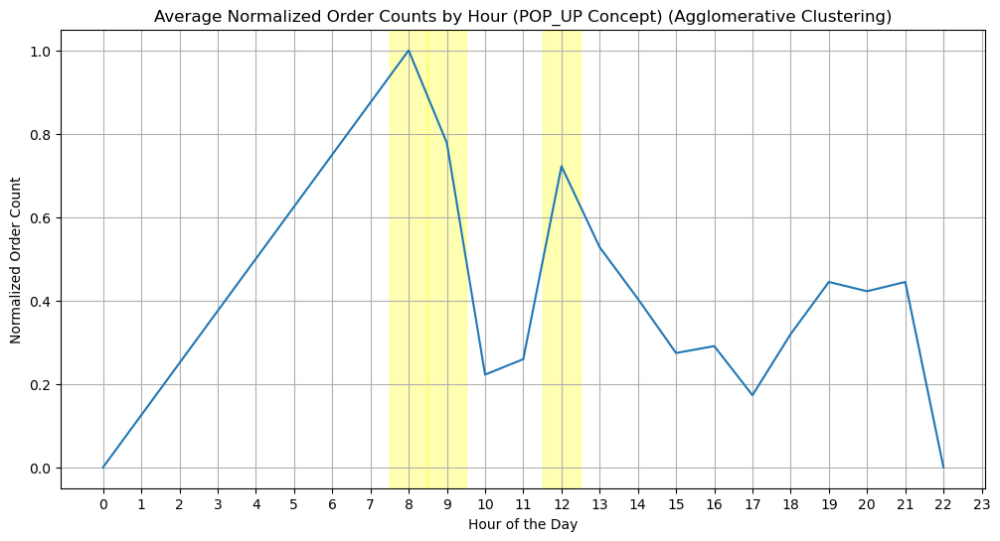

Peak hours for POP_UP concept (Clustered Approach):
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 9    ┆ 0.777778               │
│ 8    ┆ 1.0                    │
│ 12   ┆ 0.722222               │
└──────┴────────────────────────┘




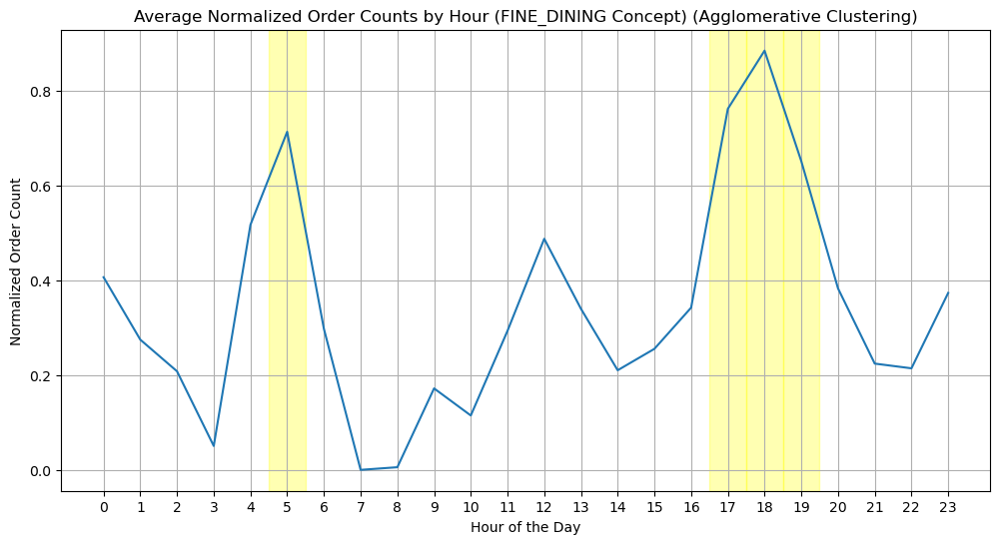

Peak hours for FINE_DINING concept (Clustered Approach):
shape: (4, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 17   ┆ 0.762713               │
│ 5    ┆ 0.714286               │
│ 18   ┆ 0.885673               │
│ 19   ┆ 0.652102               │
└──────┴────────────────────────┘




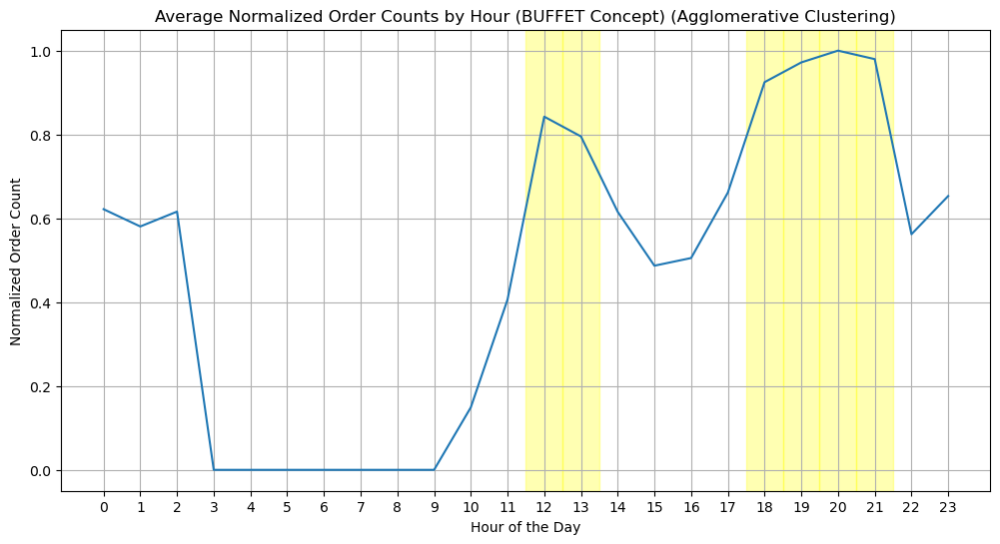

Peak hours for BUFFET concept (Clustered Approach):
shape: (6, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 13   ┆ 0.795338               │
│ 19   ┆ 0.971906               │
│ 20   ┆ 1.0                    │
│ 12   ┆ 0.842524               │
│ 18   ┆ 0.924776               │
│ 21   ┆ 0.979742               │
└──────┴────────────────────────┘




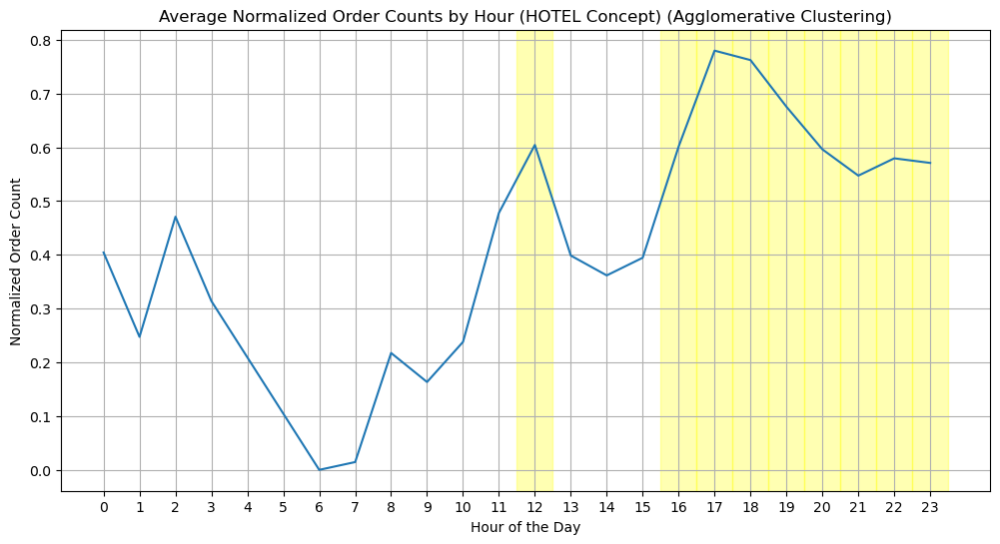

Peak hours for HOTEL concept (Clustered Approach):
shape: (9, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 16   ┆ 0.601378               │
│ 17   ┆ 0.779963               │
│ 19   ┆ 0.675583               │
│ 12   ┆ 0.604524               │
│ 21   ┆ 0.547405               │
│ 23   ┆ 0.57106                │
│ 20   ┆ 0.596318               │
│ 18   ┆ 0.762368               │
│ 22   ┆ 0.579585               │
└──────┴────────────────────────┘




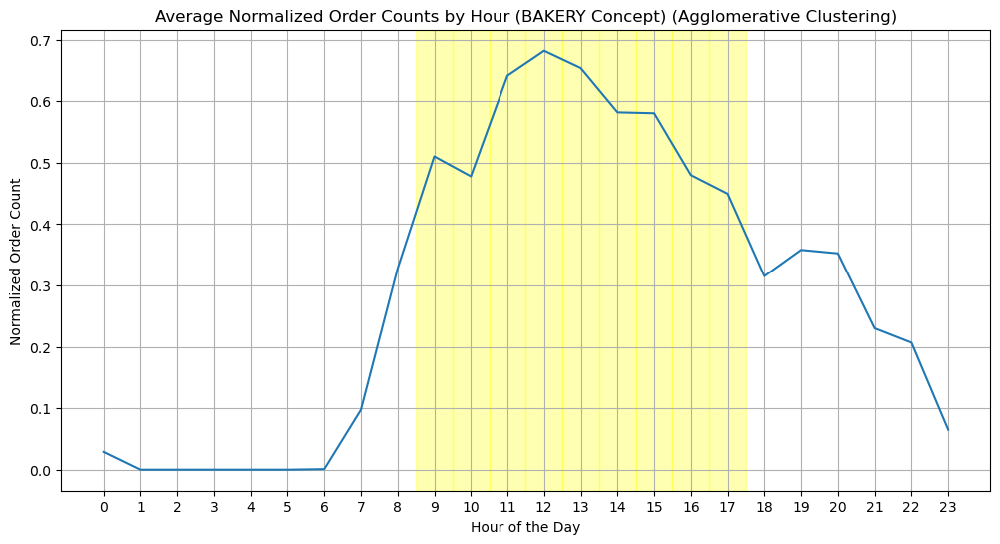

Peak hours for BAKERY concept (Clustered Approach):
shape: (9, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 14   ┆ 0.581964               │
│ 10   ┆ 0.477816               │
│ 15   ┆ 0.580519               │
│ 9    ┆ 0.510325               │
│ 13   ┆ 0.653923               │
│ 16   ┆ 0.479892               │
│ 12   ┆ 0.682075               │
│ 11   ┆ 0.641594               │
│ 17   ┆ 0.449488               │
└──────┴────────────────────────┘




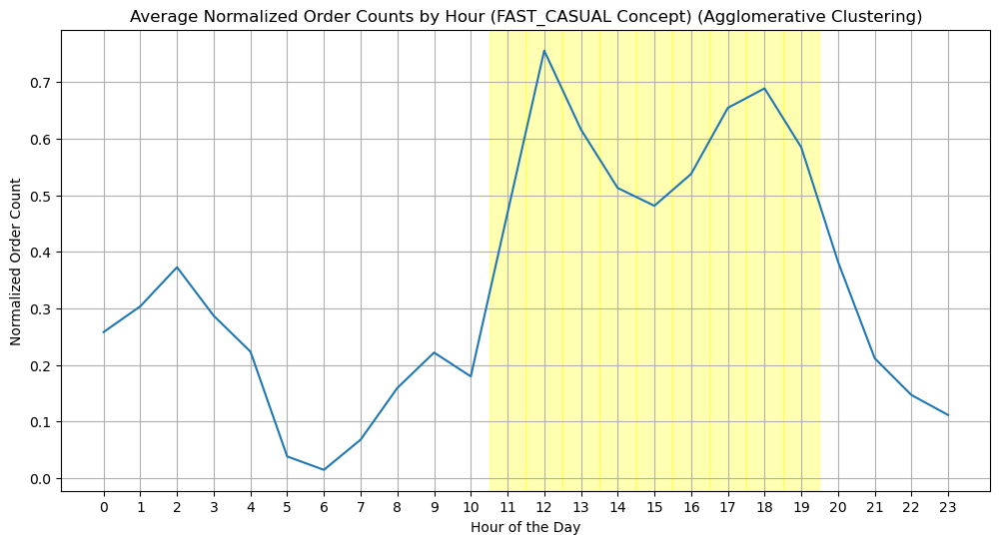

Peak hours for FAST_CASUAL concept (Clustered Approach):
shape: (9, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 15   ┆ 0.481255               │
│ 19   ┆ 0.584537               │
│ 14   ┆ 0.512754               │
│ 13   ┆ 0.616157               │
│ 12   ┆ 0.755621               │
│ 16   ┆ 0.537534               │
│ 11   ┆ 0.468539               │
│ 17   ┆ 0.654426               │
│ 18   ┆ 0.688826               │
└──────┴────────────────────────┘




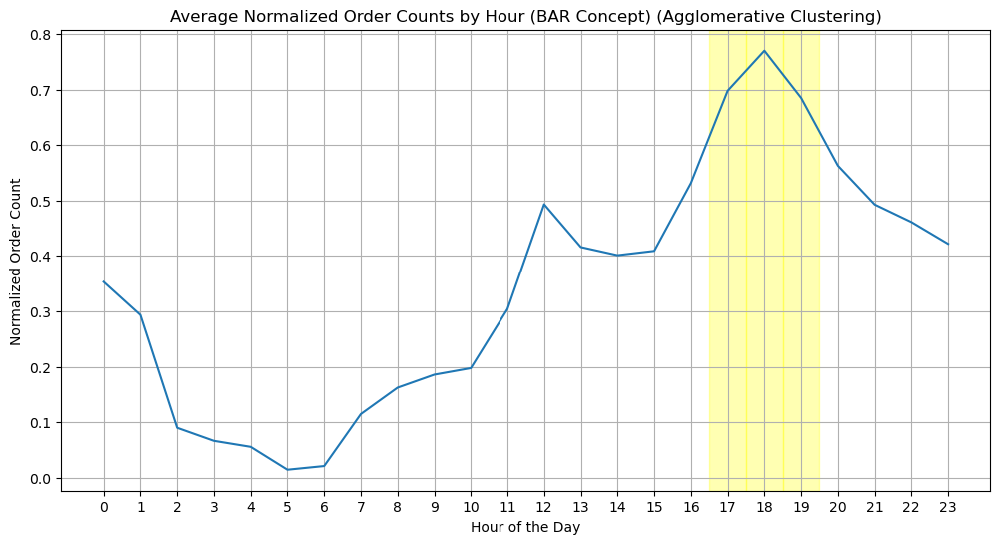

Peak hours for BAR concept (Clustered Approach):
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.769765               │
│ 17   ┆ 0.697619               │
│ 19   ┆ 0.684777               │
└──────┴────────────────────────┘




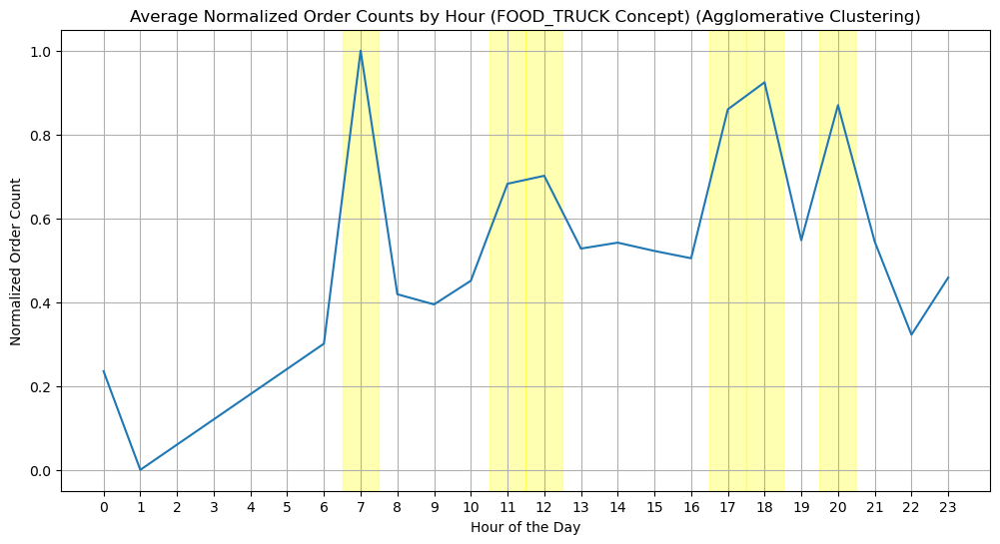

Peak hours for FOOD_TRUCK concept (Clustered Approach):
shape: (6, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 7    ┆ 1.0                    │
│ 18   ┆ 0.924481               │
│ 11   ┆ 0.68248                │
│ 17   ┆ 0.859965               │
│ 20   ┆ 0.870063               │
│ 12   ┆ 0.701492               │
└──────┴────────────────────────┘




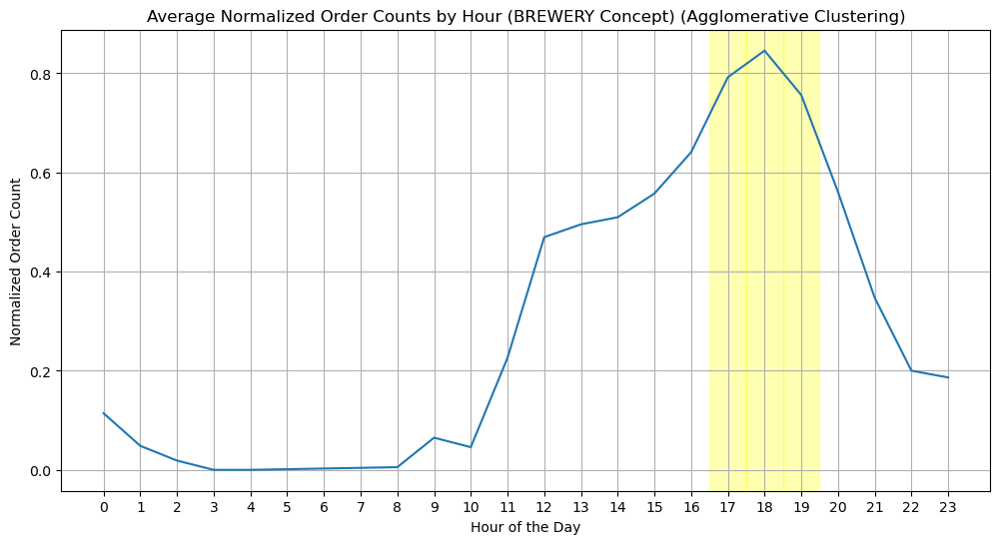

Peak hours for BREWERY concept (Clustered Approach):
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.845708               │
│ 17   ┆ 0.791958               │
│ 19   ┆ 0.756124               │
└──────┴────────────────────────┘




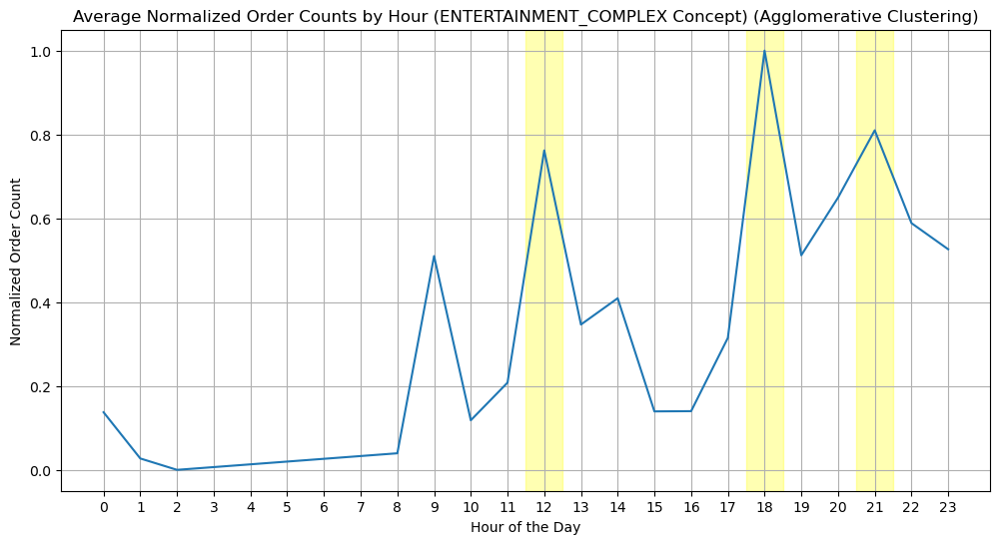

Peak hours for ENTERTAINMENT_COMPLEX concept (Clustered Approach):
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 21   ┆ 0.809931               │
│ 18   ┆ 1.0                    │
│ 12   ┆ 0.76202                │
└──────┴────────────────────────┘




In [51]:
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
import seaborn as sns

# Group by concept and hour, then calculate the mean normalized order count
concept_hourly_avg = (
    average_hourly_order_counts
    .group_by(['concept', 'hour'])
    .agg(pl.mean('normalized_order_count').alias('normalized_order_count'))
)

concepts = concept_hourly_avg.select('concept').unique().to_series().to_list()

for concept in concepts:
    plt.figure(figsize=(12, 6))
    concept_data = concept_hourly_avg.filter(pl.col('concept') == concept)
    
    # Reshape data for clustering
    X = concept_data.select('normalized_order_count').to_numpy()
    
    # Apply Agglomerative Clustering (choosing 3 clusters for peak, mid, low)
    agg_clustering = AgglomerativeClustering(n_clusters=3)
    concept_data = concept_data.with_columns(
        pl.Series(name='cluster', values=agg_clustering.fit_predict(X))
    )
    
    # Determine which cluster represents peak hours (highest avg order count)
    cluster_means = (
        concept_data
        .group_by('cluster')
        .agg(pl.mean('normalized_order_count').alias('cluster_mean'))
        .sort('cluster_mean', descending=True)
    )
    peak_cluster = cluster_means[0, 'cluster']
    
    # Identify peak hours
    peak_hours = concept_data.filter(pl.col('cluster') == peak_cluster)
    
    # Plot data
    sns.lineplot(
        data=concept_data.to_pandas(),
        x='hour',
        y='normalized_order_count'
    )
    
    # Highlight peak hours
    for row in peak_hours.iter_rows(named=True):
        plt.axvspan(row['hour'] - 0.5, row['hour'] + 0.5, color='yellow', alpha=0.3)
    
    plt.title(f'Average Normalized Order Counts by Hour ({concept} Concept) (Agglomerative Clustering)')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Normalized Order Count')
    plt.grid(True)
    plt.xticks(range(0, 24))
    plt.show()
    
    print(f"Peak hours for {concept} concept (Clustered Approach):")
    print(peak_hours.select(['hour', 'normalized_order_count']))
    print("\n" + "="*40 + "\n")
